In [44]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# for visualizing data
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# For randomized data splitting
from sklearn.model_selection import train_test_split

# To build model for prediction
import statsmodels.api as sm
import statsmodels.stats.api as sms

# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LogisticRegression

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    precision_recall_curve,
    roc_curve,
     ConfusionMatrixDisplay
)

import warnings
warnings.filterwarnings("ignore")

### Problem 1: Linear Regression

The comp-activ database is a collection of computer systems activity measures.
The data was collected from a Sun Sparcstation 20/712 with 128 Mbytes of memory running in a multi-user university department. Users would typically be doing a large variety of tasks ranging from accessing the internet, editing files, or running very CPU-bound programs. 

As you are a budding data scientist you thought to find out a linear equation to build a model to predict 'usr'(Portion of time (%) that cpu runs in user mode) and to find out how each attribute affects the system to be in 'usr' mode using a list of system attributes.

#### 1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.

In [2]:
df=pd.read_excel('compactiv.xlsx')
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,NaN,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,NaN,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,NaN,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


In [3]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [6]:
df.shape

(8192, 22)

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

### Exploratory data analysis

#### usr

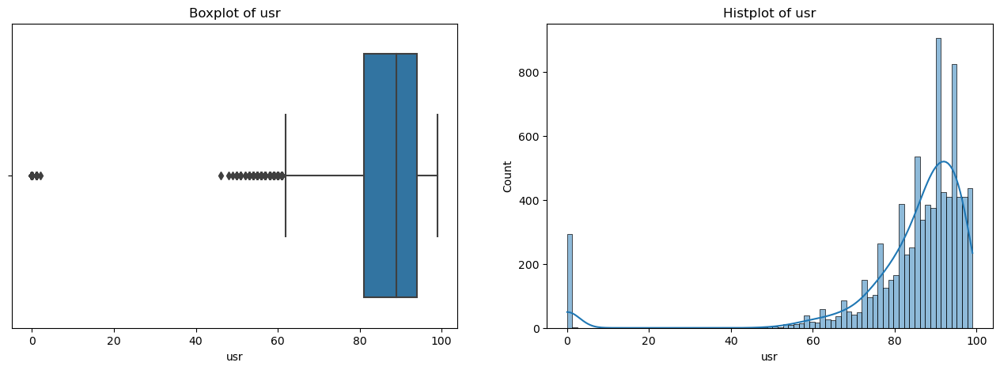

In [10]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['usr'],ax=axis[0])
sns.histplot(x=df['usr'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of usr')
axis[1].set_title('Histplot of usr')
plt.show()

In [11]:
print('Minimum usr: ', df['usr'].min())
print('First quartile (Q1) of usr: ',np.percentile(df['usr'],25))
print('Median value: ',df['usr'].median())
print('Third quartile (Q3) of usr: ',np.percentile(df['usr'],75))
print('Maximum usr: ', df['usr'].max())

Minimum usr:  0
First quartile (Q1) of usr:  81.0
Median value:  89.0
Third quartile (Q3) of usr:  94.0
Maximum usr:  99


#### lread

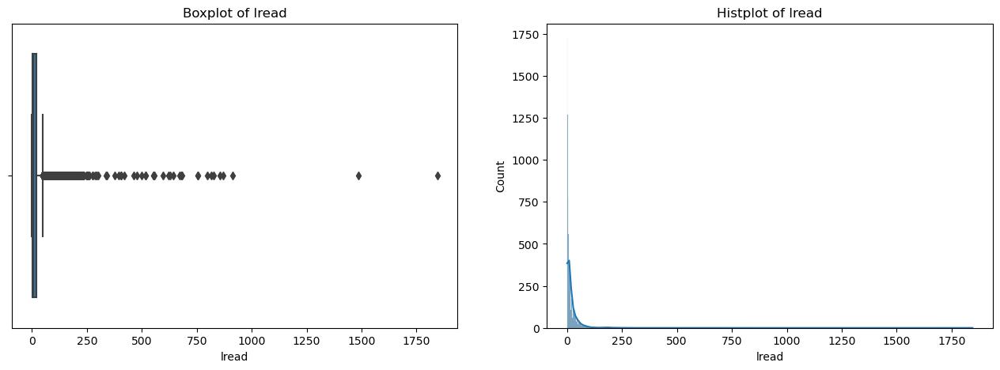

In [12]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['lread'],ax=axis[0])
sns.histplot(x=df['lread'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of lread')
axis[1].set_title('Histplot of lread')
plt.show()

In [13]:
print('Minimum lread: ', df['lread'].min())
print('First quartile (Q1) of lread: ',np.percentile(df['lread'],25))
print('Median value: ',df['lread'].median())
print('Third quartile (Q3) of lread: ',np.percentile(df['lread'],75))
print('Maximum lread: ', df['lread'].max())

Minimum lread:  0
First quartile (Q1) of lread:  2.0
Median value:  7.0
Third quartile (Q3) of lread:  20.0
Maximum lread:  1845


#### lwrite

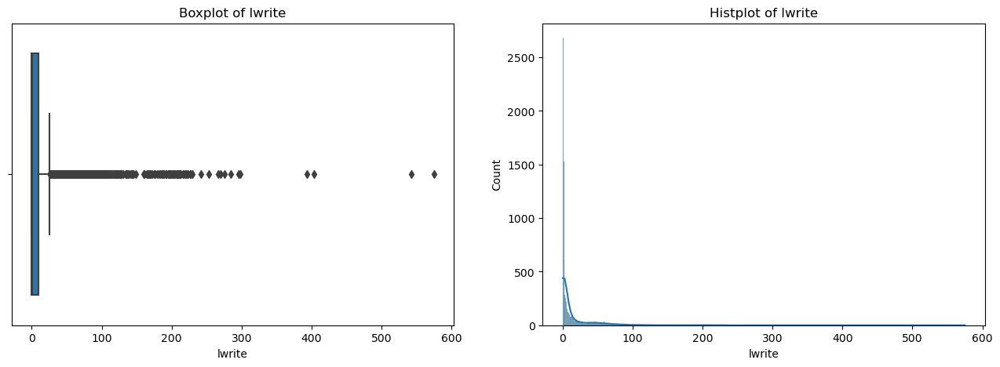

In [14]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['lwrite'],ax=axis[0])
sns.histplot(x=df['lwrite'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of lwrite')
axis[1].set_title('Histplot of lwrite')
plt.show()

In [15]:
print('Minimum lwrite: ', df['lwrite'].min())
print('First quartile (Q1) of lwrite: ',np.percentile(df['lwrite'],25))
print('Median value: ',df['lwrite'].median())
print('Third quartile (Q3) of lwrite: ',np.percentile(df['lwrite'],75))
print('Maximum lwrite: ', df['lwrite'].max())

Minimum lwrite:  0
First quartile (Q1) of lwrite:  0.0
Median value:  1.0
Third quartile (Q3) of lwrite:  10.0
Maximum lwrite:  575


#### scall

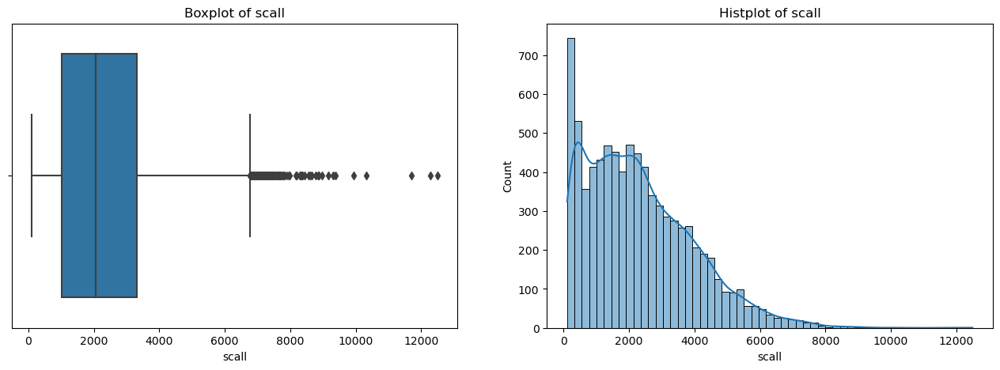

In [16]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['scall'],ax=axis[0])
sns.histplot(x=df['scall'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of scall')
axis[1].set_title('Histplot of scall')
plt.show()

In [17]:
print('Minimum scall: ', df['scall'].min())
print('First quartile (Q1) of scall: ',np.percentile(df['scall'],25))
print('Median value: ',df['scall'].median())
print('Third quartile (Q3) of scall: ',np.percentile(df['scall'],75))
print('Maximum scall: ', df['scall'].max())

Minimum scall:  109
First quartile (Q1) of scall:  1012.0
Median value:  2051.5
Third quartile (Q3) of scall:  3317.25
Maximum scall:  12493


#### sread

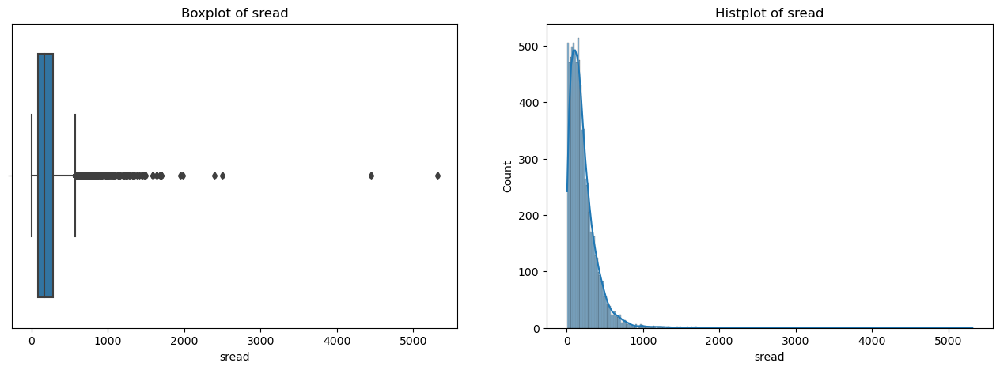

In [18]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['sread'],ax=axis[0])
sns.histplot(x=df['sread'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of sread')
axis[1].set_title('Histplot of sread')
plt.show()

In [19]:
print('Minimum sread: ', df['sread'].min())
print('First quartile (Q1) of sread: ',np.percentile(df['sread'],25))
print('Median value: ',df['sread'].median())
print('Third quartile (Q3) of sread: ',np.percentile(df['sread'],75))
print('Maximum sread: ', df['sread'].max())

Minimum sread:  6
First quartile (Q1) of sread:  86.0
Median value:  166.0
Third quartile (Q3) of sread:  279.0
Maximum sread:  5318


#### swrite

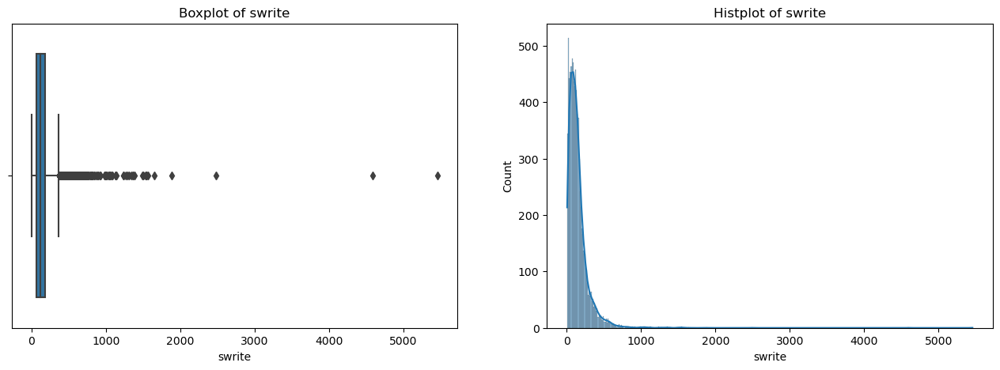

In [20]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['swrite'],ax=axis[0])
sns.histplot(x=df['swrite'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of swrite')
axis[1].set_title('Histplot of swrite')
plt.show()

In [21]:
print('Minimum swrite: ', df['swrite'].min())
print('First quartile (Q1) of swrite: ',np.percentile(df['swrite'],25))
print('Median value: ',df['swrite'].median())
print('Third quartile (Q3) of swrite: ',np.percentile(df['swrite'],75))
print('Maximum swrite: ', df['swrite'].max())

Minimum swrite:  7
First quartile (Q1) of swrite:  63.0
Median value:  117.0
Third quartile (Q3) of swrite:  185.0
Maximum swrite:  5456


#### fork

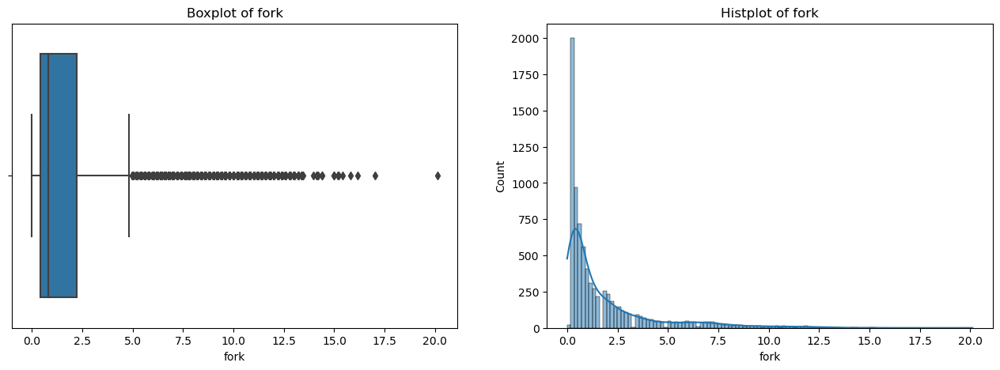

In [22]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['fork'],ax=axis[0])
sns.histplot(x=df['fork'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of fork')
axis[1].set_title('Histplot of fork')
plt.show()

In [23]:
print('Minimum fork: ', df['fork'].min())
print('First quartile (Q1) of fork: ',np.percentile(df['fork'],25))
print('Median value: ',df['fork'].median())
print('Third quartile (Q3) of fork: ',np.percentile(df['fork'],75))
print('Maximum fork: ', df['fork'].max())

Minimum fork:  0.0
First quartile (Q1) of fork:  0.4
Median value:  0.8
Third quartile (Q3) of fork:  2.2
Maximum fork:  20.12


#### exec

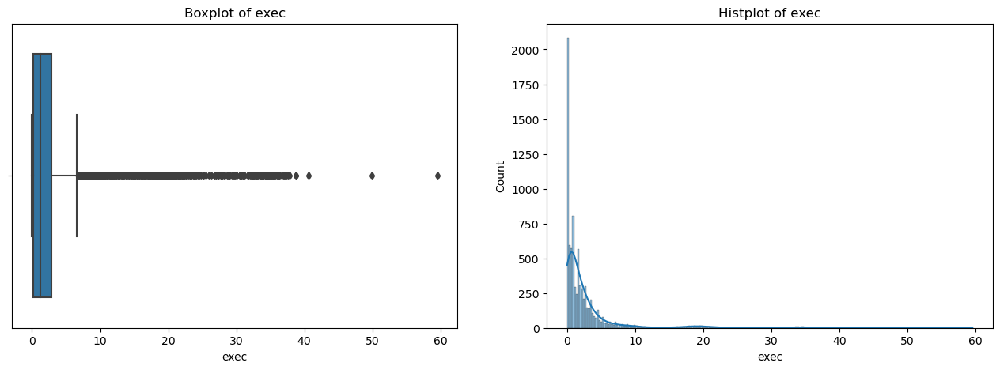

In [24]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['exec'],ax=axis[0])
sns.histplot(x=df['exec'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of exec')
axis[1].set_title('Histplot of exec')
plt.show()

In [32]:
print('Minimum exec: ', df['exec'].min())
print('First quartile (Q1) of exec: ',np.percentile(df['exec'],25))
print('Median value: ',df['exec'].median())
print('Third quartile (Q3) of exec: ',np.percentile(df['exec'],75))
print('Maximum exec: ', df['exec'].max())

Minimum exec:  0.0
First quartile (Q1) of exec:  0.2
Median value:  1.2
Third quartile (Q3) of exec:  2.8
Maximum exec:  59.56


#### rchar

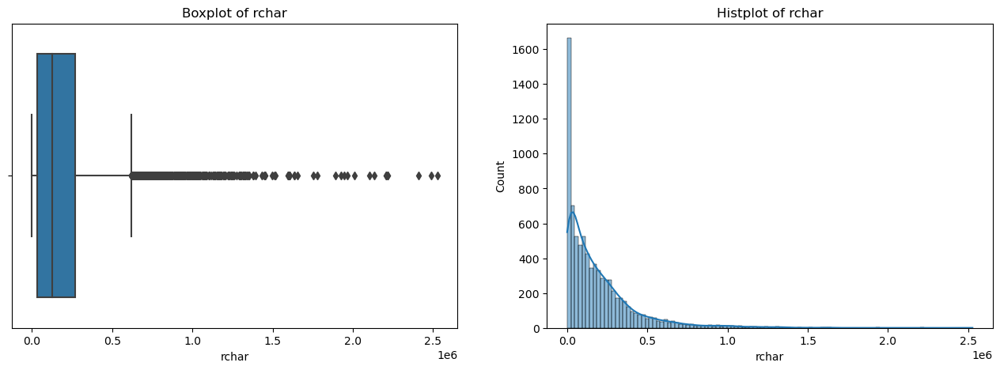

In [33]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['rchar'],ax=axis[0])
sns.histplot(x=df['rchar'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of rchar')
axis[1].set_title('Histplot of rchar')
plt.show()

In [34]:
print('Minimum rchar: ', df['rchar'].min())
print('First quartile (Q1) of rchar: ',np.percentile(df['rchar'],25))
print('Median value: ',df['rchar'].median())
print('Third quartile (Q3) of rchar: ',np.percentile(df['rchar'],75))
print('Maximum rchar: ', df['rchar'].max())

Minimum rchar:  278.0
First quartile (Q1) of rchar:  nan
Median value:  125473.5
Third quartile (Q3) of rchar:  nan
Maximum rchar:  2526649.0


#### wchar

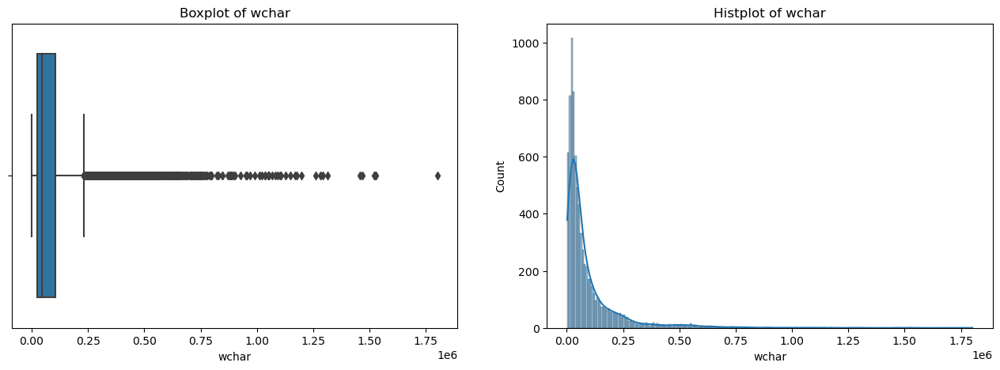

In [35]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['wchar'],ax=axis[0])
sns.histplot(x=df['wchar'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of wchar')
axis[1].set_title('Histplot of wchar')
plt.show()

In [36]:
print('Minimum wchar: ', df['wchar'].min())
print('First quartile (Q1) of wchar: ',np.percentile(df['wchar'],25))
print('Median value: ',df['wchar'].median())
print('Third quartile (Q3) of wchar: ',np.percentile(df['wchar'],75))
print('Maximum wchar: ', df['wchar'].max())

Minimum wchar:  1498.0
First quartile (Q1) of wchar:  nan
Median value:  46619.0
Third quartile (Q3) of wchar:  nan
Maximum wchar:  1801623.0


#### pgout

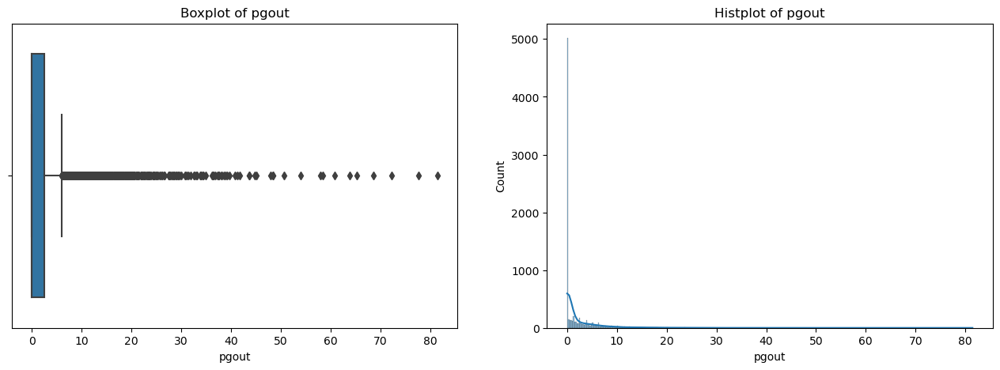

In [37]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['pgout'],ax=axis[0])
sns.histplot(x=df['pgout'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of pgout')
axis[1].set_title('Histplot of pgout')
plt.show()

In [38]:
print('Minimum pgout: ', df['pgout'].min())
print('First quartile (Q1) of pgout: ',np.percentile(df['pgout'],25))
print('Median value: ',df['pgout'].median())
print('Third quartile (Q3) of pgout: ',np.percentile(df['pgout'],75))
print('Maximum pgout: ', df['pgout'].max())

Minimum pgout:  0.0
First quartile (Q1) of pgout:  0.0
Median value:  0.0
Third quartile (Q3) of pgout:  2.4
Maximum pgout:  81.44


#### ppgout

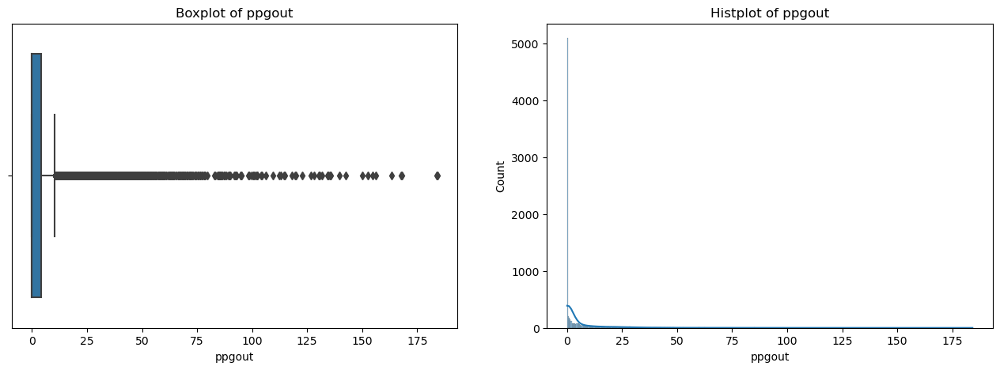

In [39]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['ppgout'],ax=axis[0])
sns.histplot(x=df['ppgout'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of ppgout')
axis[1].set_title('Histplot of ppgout')
plt.show()

In [40]:
print('Minimum ppgout: ', df['ppgout'].min())
print('First quartile (Q1) of ppgout: ',np.percentile(df['ppgout'],25))
print('Median value: ',df['ppgout'].median())
print('Third quartile (Q3) of ppgout: ',np.percentile(df['ppgout'],75))
print('Maximum ppgout: ', df['ppgout'].max())

Minimum ppgout:  0.0
First quartile (Q1) of ppgout:  0.0
Median value:  0.0
Third quartile (Q3) of ppgout:  4.2
Maximum ppgout:  184.2


#### pgfree

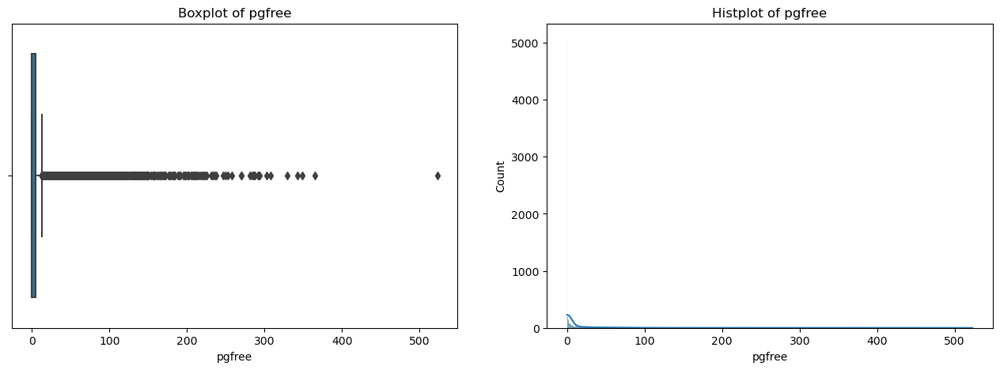

In [41]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['pgfree'],ax=axis[0])
sns.histplot(x=df['pgfree'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of pgfree')
axis[1].set_title('Histplot of pgfree')
plt.show()

In [3]:
print('Minimum pgfree: ', df['pgfree'].min())
print('First quartile (Q1) of pgfree: ',np.percentile(df['pgfree'],25))
print('Median value: ',df['pgfree'].median())
print('Third quartile (Q3) of pgfree: ',np.percentile(df['pgfree'],75))
print('Maximum pgfree: ', df['pgfree'].max())

Minimum pgfree:  0.0
First quartile (Q1) of pgfree:  0.0
Median value:  0.0
Third quartile (Q3) of pgfree:  5.0
Maximum pgfree:  523.0


#### pgscan

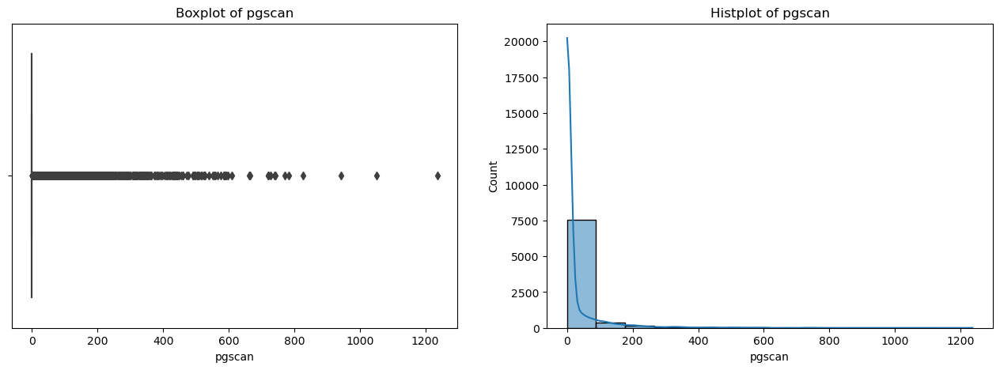

In [43]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['pgscan'],ax=axis[0])
sns.histplot(x=df['pgscan'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of pgscan')
axis[1].set_title('Histplot of pgscan')
plt.show()

In [44]:
print('Minimum pgscan: ', df['pgscan'].min())
print('First quartile (Q1) of pgscan: ',np.percentile(df['pgscan'],25))
print('Median value: ',df['pgscan'].median())
print('Third quartile (Q3) of pgscan: ',np.percentile(df['pgscan'],75))
print('Maximum pgscan: ', df['pgscan'].max())

Minimum pgscan:  0.0
First quartile (Q1) of pgscan:  0.0
Median value:  0.0
Third quartile (Q3) of pgscan:  0.0
Maximum pgscan:  1237.0


#### atch

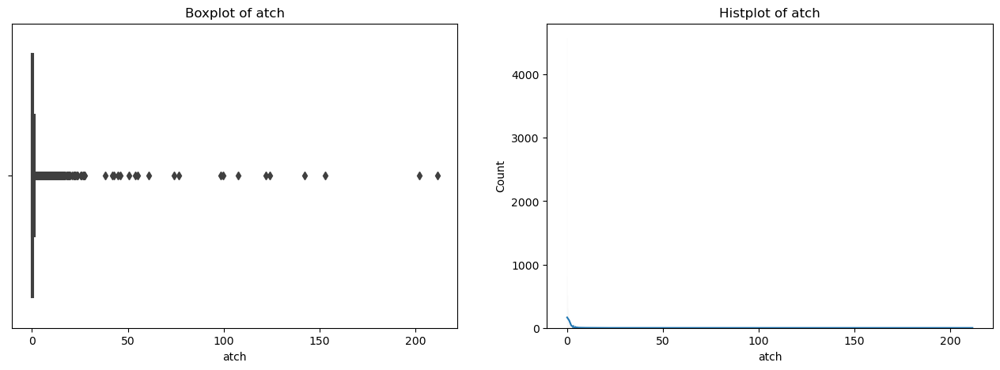

In [45]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['atch'],ax=axis[0])
sns.histplot(x=df['atch'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of atch')
axis[1].set_title('Histplot of atch')
plt.show()

In [46]:
print('Minimum atch: ', df['atch'].min())
print('First quartile (Q1) of atch: ',np.percentile(df['atch'],25))
print('Median value: ',df['atch'].median())
print('Third quartile (Q3) of atch: ',np.percentile(df['atch'],75))
print('Maximum atch: ', df['atch'].max())

Minimum atch:  0.0
First quartile (Q1) of atch:  0.0
Median value:  0.0
Third quartile (Q3) of atch:  0.6
Maximum atch:  211.58


#### pgin

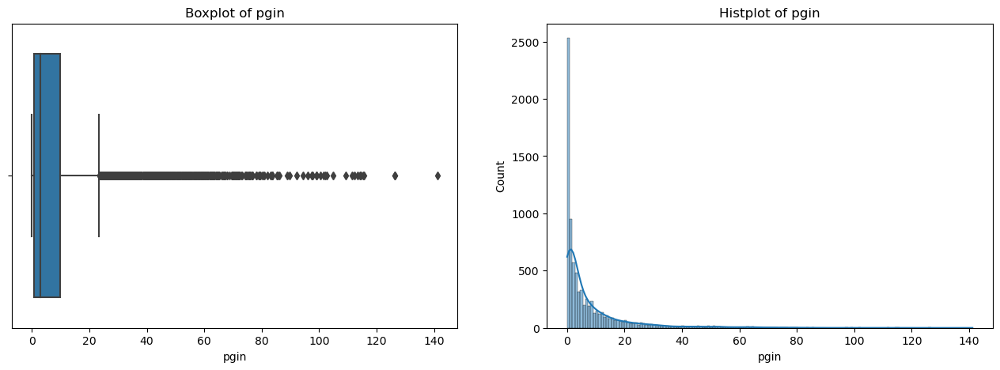

In [47]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['pgin'],ax=axis[0])
sns.histplot(x=df['pgin'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of pgin')
axis[1].set_title('Histplot of pgin')
plt.show()

In [48]:
print('Minimum pgin: ', df['pgin'].min())
print('First quartile (Q1) of pgin: ',np.percentile(df['pgin'],25))
print('Median value: ',df['pgin'].median())
print('Third quartile (Q3) of pgin: ',np.percentile(df['pgin'],75))
print('Maximum pgin: ', df['pgin'].max())

Minimum pgin:  0.0
First quartile (Q1) of pgin:  0.6
Median value:  2.8
Third quartile (Q3) of pgin:  9.765
Maximum pgin:  141.2


#### ppgin

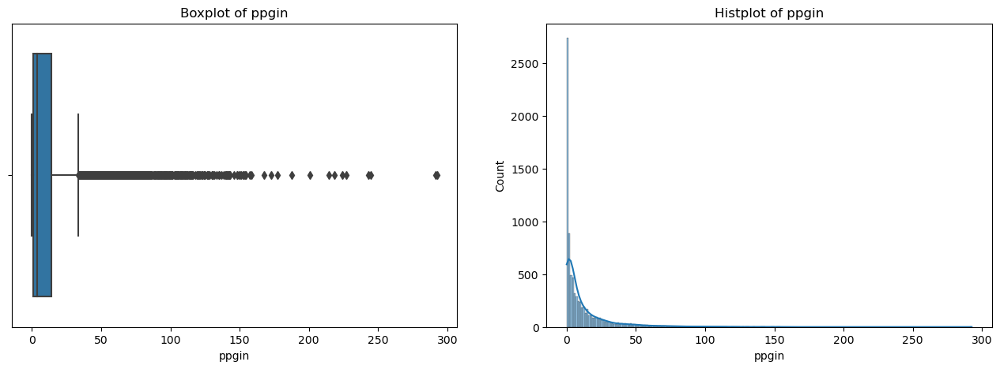

In [49]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['ppgin'],ax=axis[0])
sns.histplot(x=df['ppgin'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of ppgin')
axis[1].set_title('Histplot of ppgin')
plt.show()

In [50]:
print('Minimum ppgin: ', df['ppgin'].min())
print('First quartile (Q1) of ppgin: ',np.percentile(df['ppgin'],25))
print('Median value: ',df['ppgin'].median())
print('Third quartile (Q3) of ppgin: ',np.percentile(df['ppgin'],75))
print('Maximum ppgin: ', df['ppgin'].max())

Minimum ppgin:  0.0
First quartile (Q1) of ppgin:  0.6
Median value:  3.8
Third quartile (Q3) of ppgin:  13.8
Maximum ppgin:  292.61


#### pflt

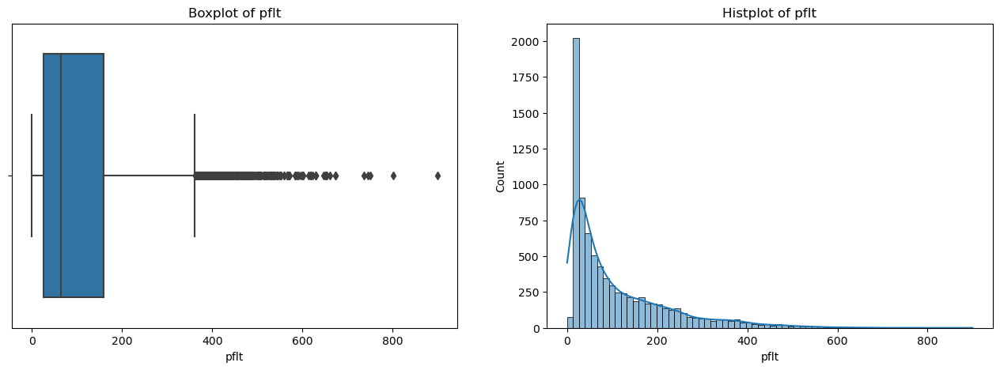

In [51]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['pflt'],ax=axis[0])
sns.histplot(x=df['pflt'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of pflt')
axis[1].set_title('Histplot of pflt')
plt.show()

In [52]:
print('Minimum pflt: ', df['pflt'].min())
print('First quartile (Q1) of pflt: ',np.percentile(df['pflt'],25))
print('Median value: ',df['pflt'].median())
print('Third quartile (Q3) of pflt: ',np.percentile(df['pflt'],75))
print('Maximum pflt: ', df['pflt'].max())

Minimum pflt:  0.0
First quartile (Q1) of pflt:  25.0
Median value:  63.8
Third quartile (Q3) of pflt:  159.6
Maximum pflt:  899.8


#### vflt

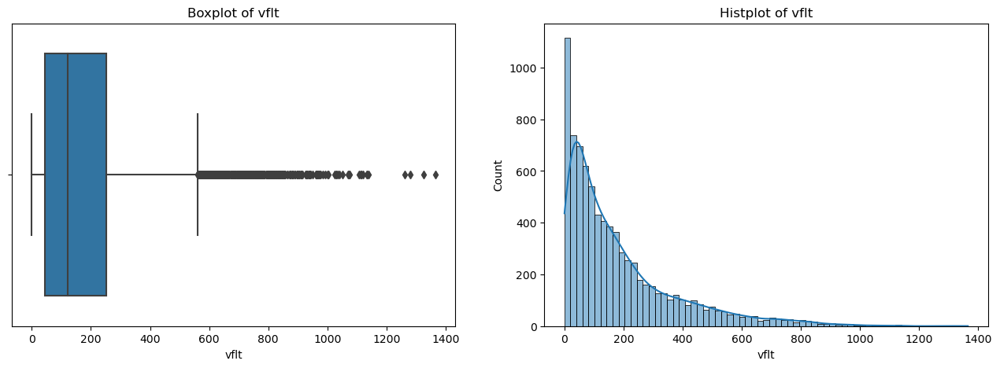

In [53]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['vflt'],ax=axis[0])
sns.histplot(x=df['vflt'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of vflt')
axis[1].set_title('Histplot of vflt')
plt.show()

In [54]:
print('Minimum vflt: ', df['vflt'].min())
print('First quartile (Q1) of vflt: ',np.percentile(df['vflt'],25))
print('Median value: ',df['vflt'].median())
print('Third quartile (Q3) of vflt: ',np.percentile(df['vflt'],75))
print('Maximum vflt: ', df['vflt'].max())

Minimum vflt:  0.2
First quartile (Q1) of vflt:  45.4
Median value:  120.4
Third quartile (Q3) of vflt:  251.8
Maximum vflt:  1365.0


#### runqsz

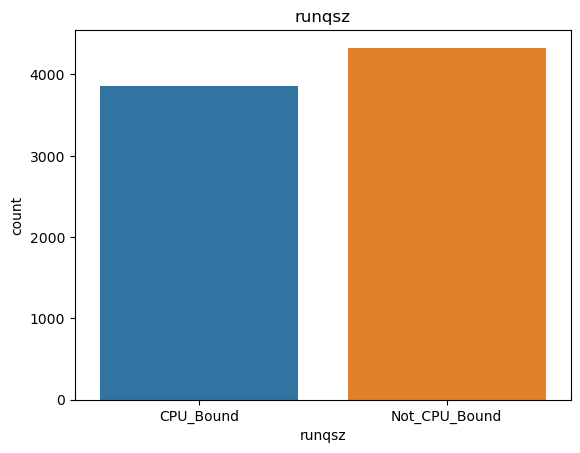

In [55]:
sns.countplot(x=df['runqsz'])
plt.title('runqsz')
plt.show();

#### freemem

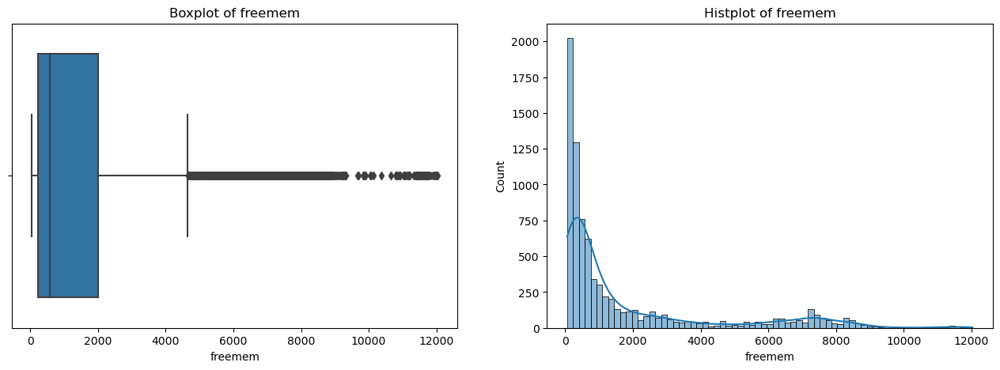

In [56]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['freemem'],ax=axis[0])
sns.histplot(x=df['freemem'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of freemem')
axis[1].set_title('Histplot of freemem')
plt.show()

In [4]:
print('Minimum freemem: ', df['freemem'].min())
print('First quartile (Q1) of freemem: ',np.percentile(df['freemem'],25))
print('Median value: ',df['freemem'].median())
print('Third quartile (Q3) of freemem: ',np.percentile(df['freemem'],75))
print('Maximum freemem: ', df['freemem'].max())

Minimum freemem:  55
First quartile (Q1) of freemem:  231.0
Median value:  579.0
Third quartile (Q3) of freemem:  2002.25
Maximum freemem:  12027


#### freeswap

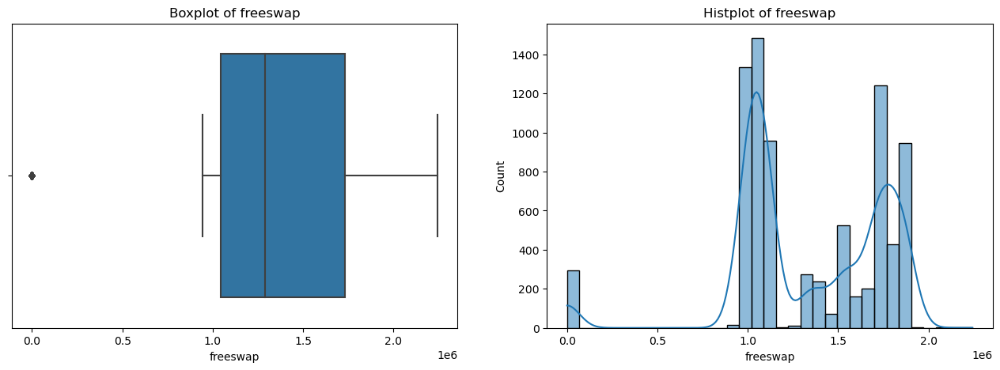

In [58]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['freeswap'],ax=axis[0])
sns.histplot(x=df['freeswap'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of freeswap')
axis[1].set_title('Histplot of freeswap')
plt.show()

In [5]:
print('Minimum freeswap: ', df['freeswap'].min())
print('First quartile (Q1) of freeswap: ',np.percentile(df['freeswap'],25))
print('Median value: ',df['freeswap'].median())
print('Third quartile (Q3) of freeswap: ',np.percentile(df['freeswap'],75))
print('Maximum freeswap: ', df['freeswap'].max())

Minimum freeswap:  2
First quartile (Q1) of freeswap:  1042623.5
Median value:  1289289.5
Third quartile (Q3) of freeswap:  1730379.5
Maximum freeswap:  2243187


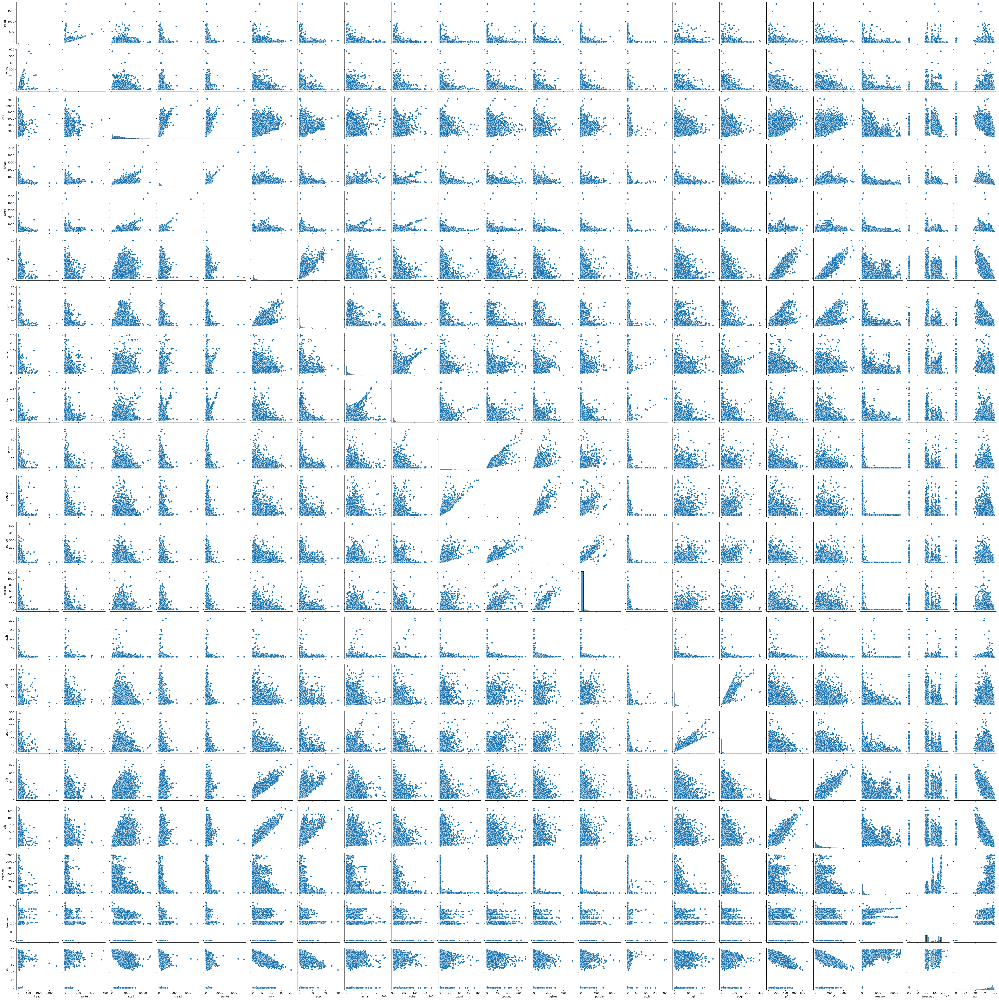

In [60]:
sns.pairplot(data=df)

<Axes: >

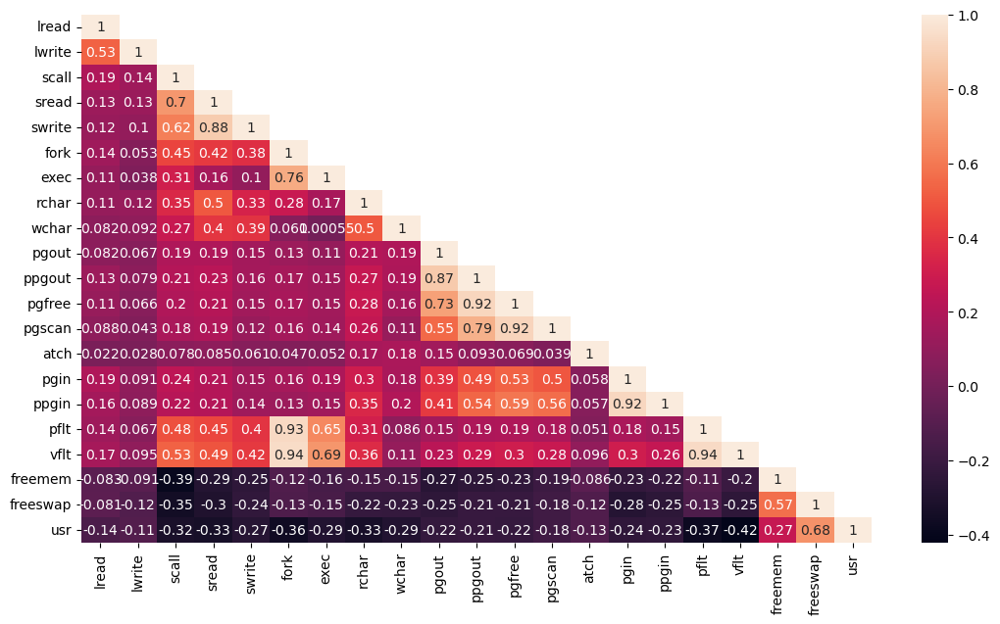

In [61]:
plt.figure(figsize=(13,7))
sns.heatmap(df.corr(),annot=True,mask=np.triu(df.corr(),+1))

#### 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

In [62]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [67]:
df['rchar']=df['rchar'].fillna(df['rchar'].median())
df['wchar']=df['wchar'].fillna(df['wchar'].median())

In [70]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
rcha        0
dtype: int64

In [77]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [79]:
df.duplicated().sum()

0

In [101]:
zeros=df.applymap(lambda x: 1 if x==0 else 0).sum()
print('Total number of 0s:\n',zeros)

Total number of 0s:
 lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz         0
freemem        0
freeswap       0
usr          283
dtype: int64


#### 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

In [88]:
#separating target and predictors
X=df.drop(['usr'],axis=1)
Y=df['usr'] 

#adding constant
X['constant']=1

In [89]:
#create dummy variables
X=pd.get_dummies(X,columns=X.select_dtypes(include=["object", "category"]).columns.tolist(),drop_first=True)
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,constant,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,1,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,1,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,1,1
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,1,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,1,1


In [91]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

In [92]:
print("Shape of Training set : ", x_train.shape)
print("Shape of Test set : ", x_test.shape)

Shape of Training set :  (5734, 22)
Shape of Test set :  (2458, 22)


In [93]:
# Applying Linear Regression using Sklearn
model = LinearRegression()
model.fit(x_train, y_train)

LinearRegression()

##### Model building

In [94]:
#1
lin_reg = sm.OLS(y_train, x_train).fit()
print(lin_reg.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.643
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                     489.6
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        22:31:48   Log-Likelihood:                -21788.
No. Observations:                5734   AIC:                         4.362e+04
Df Residuals:                    5712   BIC:                         4.377e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lread                   -0.0199 

In [95]:
olstest = sm.OLS(y_test, x_test)
olstestres = olstest.fit()
print(olstestres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     206.8
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        22:33:10   Log-Likelihood:                -9479.1
No. Observations:                2458   AIC:                         1.900e+04
Df Residuals:                    2436   BIC:                         1.913e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lread                   -0.0195 

#### Model performance check

In [96]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

In [97]:
# checking model performance on train set (seen 70% data)
print("Training Performance\n")
olsmodel_train_perf = model_performance_regression(lin_reg, x_train, y_train)
olsmodel_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,10.813214,7.768781,0.64284,0.641464,inf


In [98]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf = model_performance_regression(lin_reg, x_test, y_test)
olsmodel_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,11.594014,8.171394,0.631217,0.627885,inf


In [102]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


def checking_vif(predictors):
    vif = pd.DataFrame()
    vif["feature"] = predictors.columns

    # calculating VIF for each feature
    vif["VIF"] = [
        variance_inflation_factor(predictors.values, i)
        for i in range(len(predictors.columns))
    ]
    return vif

checking_vif(x_train)

,feature,VIF
0,lread,1.472618
1,lwrite,1.405898
2,scall,2.414301
3,sread,6.836403
4,swrite,5.320692
5,fork,18.210503
6,exec,3.059950
7,rchar,1.974726
8,wchar,1.553348
9,pgout,5.776005


In [103]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train  # actual values
df_pred["Fitted Values"] = lin_reg.fittedvalues  # predicted values
df_pred["Residuals"] = lin_reg.resid  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
694,91,83.397386,7.602614
5535,94,83.576344,10.423656
4244,0,42.971134,-42.971134
2472,83,72.705492,10.294508
7052,94,102.942178,-8.942178


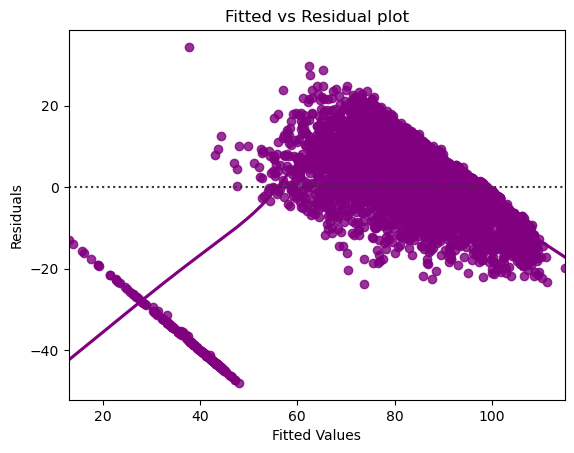

In [104]:
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

In [105]:
# predictions on the test set
pred = lin_reg.predict(x_test)

df_pred_test = pd.DataFrame({"Actual": y_test, "Predicted": pred})
df_pred_test.sample(10, random_state=1)

,Actual,Predicted
3904,75,75.000585
2603,78,65.071669
8130,95,84.723177
3100,74,71.089485
2726,97,75.281332
717,89,98.263248
847,90,92.083188
2652,92,96.309702
1198,84,77.439180
6284,86,80.325140


In [106]:
#2
# On treating outliers

def treat_outlier(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    column_copy = column.copy()
    column_copy[(column > upper_bound)] = upper_bound
    column_copy[(column < lower_bound)] = lower_bound

    return column_copy

In [107]:
for column_name in df.columns:
    if pd.api.types.is_numeric_dtype(df[column_name]):
        df[column_name] = treat_outlier(df[column_name])

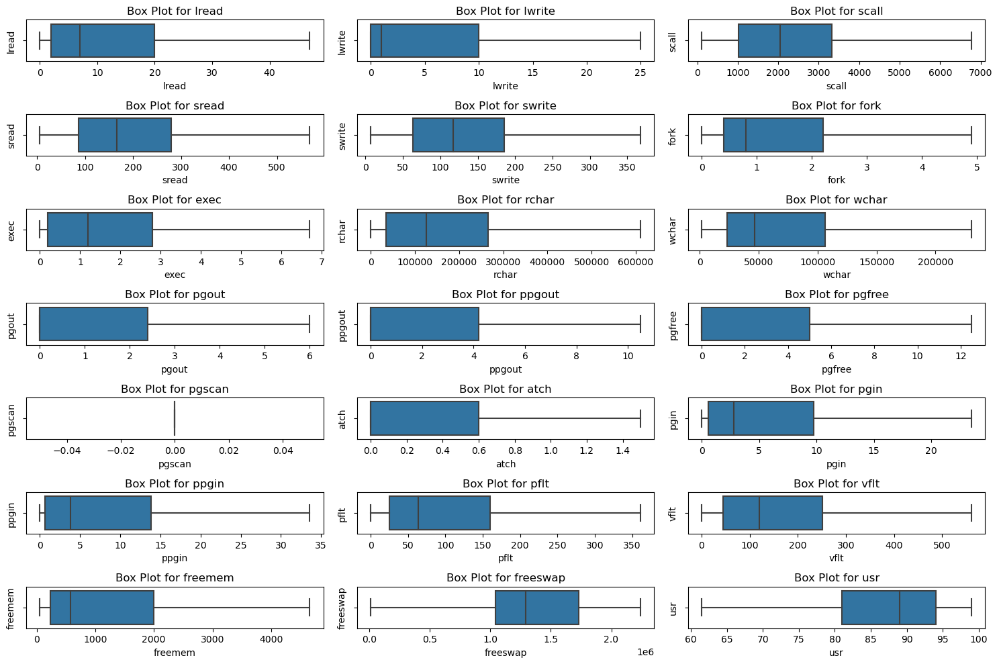

In [111]:
numeric_columns = df.select_dtypes(include=['number'])
fig, axes = plt.subplots(7, 3, figsize=(15, 10))
axes = axes.flatten()

for i, column_name in enumerate(numeric_columns.columns):
    sns.boxplot(data=numeric_columns, x=column_name,  ax=axes[i])
    axes[i].set_title(f'Box Plot for {column_name}')
    axes[i].set_ylabel(column_name)
plt.tight_layout()
plt.show()

In [113]:
x1=df.drop(['usr'],axis=1)
y1=df['usr']
x1['constant']=1
x1 = pd.get_dummies(x1, columns=['runqsz'], drop_first=True)

In [114]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x1, y1, test_size=0.3, random_state=1)

In [115]:
# Applying Linear Regression using Sklearn
model1 = LinearRegression()
model1.fit(x_train1, y_train1)

LinearRegression()

In [116]:
lin_reg1 = sm.OLS(y_train1, x_train1).fit()
print(lin_reg1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1115.
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        22:47:54   Log-Likelihood:                -16657.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5713   BIC:                         3.350e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lread                   -0.0635 

In [117]:
olstest1 = sm.OLS(y_test1, x_test1)
olstestres1 = olstest1.fit()
print(olstestres1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     415.5
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        22:48:09   Log-Likelihood:                -7237.0
No. Observations:                2458   AIC:                         1.452e+04
Df Residuals:                    2437   BIC:                         1.464e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lread                   -0.0514 

In [118]:
olsmodel_train_perf1 = model_performance_regression(lin_reg1, x_train1, y_train1)
olsmodel_train_perf1

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.419536,3.285268,0.796109,0.795323,4.07469


In [119]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf1 = model_performance_regression(olstestres1, x_test1, y_test1)
olsmodel_test_perf1

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.596708,3.447267,0.773249,0.771201,4.270487


In [120]:
checking_vif(x_train1)

,feature,VIF
0,lread,5.350560
1,lwrite,4.328397
2,scall,2.960609
3,sread,6.420172
4,swrite,5.597135
5,fork,13.035359
6,exec,3.241417
7,rchar,2.133616
8,wchar,1.584381
9,pgout,11.360363


In [121]:
df_pred1 = pd.DataFrame()

df_pred1["Actual Values"] = y_train1  # actual values
df_pred1["Fitted Values"] = lin_reg1.fittedvalues  # predicted values
df_pred1["Residuals"] = lin_reg1.resid  # residuals

df_pred1.head()

,Actual Values,Fitted Values,Residuals
694,91.0,91.507801,-0.507801
5535,94.0,91.778831,2.221169
4244,61.5,74.855263,-13.355263
2472,83.0,80.729524,2.270476
7052,94.0,98.268952,-4.268952


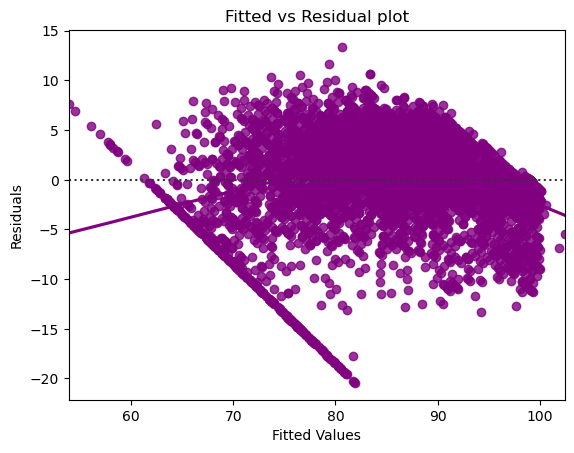

In [122]:
sns.residplot(
    data=df_pred1, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

In [123]:
# predictions on the test set
pred1 = lin_reg1.predict(x_test1)

df_pred_test1 = pd.DataFrame({"Actual": y_test1, "Predicted": pred1})
df_pred_test1.sample(10, random_state=1)

,Actual,Predicted
3904,75.0,78.226652
2603,78.0,76.059766
8130,95.0,91.685942
3100,74.0,72.067431
2726,97.0,90.564449
717,89.0,92.847531
847,90.0,91.087303
2652,92.0,91.736531
1198,84.0,82.296006
6284,86.0,81.256856


* There are multiple columns with very high VIF values, indicating presence of strong multicollinearity
* We will systematically drop numerical columns with VIF > 5
* We will ignore the VIF values for dummy variables and the constant (intercept)

In [151]:
x2=df.drop(['usr'],axis=1)
y2=df['usr']
x2 = sm.add_constant(x2)
x2 = pd.get_dummies(x2, columns=['runqsz'], drop_first=True)

In [152]:
x_train2, x_test2, y_train2, y_test2 = train_test_split(x2, y2, test_size=0.3, random_state=1)

In [153]:
x_train2=x_train2.drop(['pgfree'],axis=1)
x_test2=x_test2.drop(['pgfree'], axis=1)

In [154]:
model2 = LinearRegression()
model2.fit(x_train2, y_train2)

LinearRegression()

In [155]:
lin_reg2 = sm.OLS(y_train2, x_train2).fit()
print(lin_reg2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1173.
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:14:42   Log-Likelihood:                -16659.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5714   BIC:                         3.349e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1583 

In [156]:
olstest2 = sm.OLS(y_test2, x_test2)
olstestres2 = olstest2.fit()
print(olstestres2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     437.5
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:14:43   Log-Likelihood:                -7237.1
No. Observations:                2458   AIC:                         1.451e+04
Df Residuals:                    2438   BIC:                         1.463e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.5493 

In [157]:
olsmodel_train_perf2 = model_performance_regression(lin_reg2, x_train2, y_train2)
olsmodel_train_perf2

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.420747,3.286002,0.795997,0.795247,4.075769


In [158]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf2 = model_performance_regression(olstestres2, x_test2, y_test2)
olsmodel_test_perf2

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.59685,3.447211,0.773235,0.77128,4.270533


In [159]:
checking_vif(x_train2)

,feature,VIF
0,const,29.104453
1,lread,5.350249
2,lwrite,4.327383
3,scall,2.958105
4,sread,6.420154
5,swrite,5.597127
6,fork,13.034330
7,exec,3.241322
8,rchar,2.133610
9,wchar,1.581770


In [160]:
x3=df.drop(['usr'],axis=1)
y3=df['usr']
x3 = sm.add_constant(x3)
x3 = pd.get_dummies(x3, columns=['runqsz'], drop_first=True)

In [161]:
x_train3, x_test3, y_train3, y_test3 = train_test_split(x3, y3, test_size=0.3, random_state=1)

In [204]:
#already remover vflt
x_train3 = x_train3.drop(['pgfree'], axis=1)
x_test3=x_test3.drop(['pgfree'], axis=1)

In [205]:
# Applying Linear Regression using Sklearn
model3 = LinearRegression()
model3.fit(x_train3, y_train3)

LinearRegression()

In [206]:
lin_reg3 = sm.OLS(y_train3, x_train3).fit()
print(lin_reg3.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1235.
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:31:41   Log-Likelihood:                -16666.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5715   BIC:                         3.350e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0182 

In [207]:
olstest3 = sm.OLS(y_test3, x_test3)
olstestres3 = olstest3.fit()
print(olstestres3.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     459.9
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:31:41   Log-Likelihood:                -7241.5
No. Observations:                2458   AIC:                         1.452e+04
Df Residuals:                    2439   BIC:                         1.463e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.3481 

In [208]:
olsmodel_train_perf3 = model_performance_regression(lin_reg3, x_train3, y_train3)
olsmodel_train_perf3

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.426288,3.291979,0.795485,0.794769,4.08224


In [209]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf3 = model_performance_regression(olstestres3, x_test3, y_test3)
olsmodel_test_perf3

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.605125,3.454343,0.772418,0.77055,4.278755


In [210]:
checking_vif(x_train3)

,feature,VIF
0,const,28.703900
1,lread,5.335255
2,lwrite,4.326141
3,scall,2.950927
4,sread,6.374687
5,swrite,5.595871
6,fork,10.087914
7,exec,3.237609
8,rchar,2.123783
9,wchar,1.559124


In [211]:
#4
x4=df.drop(['usr'],axis=1)
y4=df['usr']
x4 = sm.add_constant(x4)
x4 = pd.get_dummies(x4, columns=['runqsz'], drop_first=True)

In [212]:
x_train4, x_test4, y_train4, y_test4 = train_test_split(x4, y4, test_size=0.3, random_state=1)

In [213]:
x_train4 = x_train4.drop(['pgfree','vflt','pgin'], axis=1)
x_test4=x_test4.drop(['pgfree','vflt','pgin'], axis=1)

In [233]:
# Applying Linear Regression using Sklearn
model4 = LinearRegression()
model4.fit(x_train4, y_train4)

LinearRegression()

In [234]:
lin_reg4 = sm.OLS(y_train4, x_train4).fit()
print(lin_reg4.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1308.
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:40:39   Log-Likelihood:                -16666.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5716   BIC:                         3.349e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0257 

In [235]:
olstest4 = sm.OLS(y_test4, x_test4)
olstestres4 = olstest4.fit()
print(olstestres4.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     487.1
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:40:39   Log-Likelihood:                -7241.5
No. Observations:                2458   AIC:                         1.452e+04
Df Residuals:                    2440   BIC:                         1.462e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.3549 

In [236]:
olsmodel_train_perf4 = model_performance_regression(lin_reg4, x_train4, y_train4)
olsmodel_train_perf4

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.426316,3.291941,0.795483,0.794802,4.082119


In [237]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf4 = model_performance_regression(olstestres4, x_test4, y_test4)
olsmodel_test_perf4

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.605142,3.454195,0.772416,0.770643,4.278554


In [238]:
checking_vif(x_train4)

,feature,VIF
0,const,28.477684
1,lread,5.333765
2,lwrite,4.326131
3,scall,2.948289
4,sread,6.374569
5,swrite,5.595550
6,fork,10.082898
7,exec,3.234015
8,rchar,2.114410
9,wchar,1.558886


In [223]:
#5
x5=df.drop(['usr'],axis=1)
y5=df['usr']
x5 = sm.add_constant(x5)
x5 = pd.get_dummies(x5, columns=['runqsz'], drop_first=True)

In [224]:
x_train5, x_test5, y_train5, y_test5 = train_test_split(x5, y5, test_size=0.3, random_state=1)

In [226]:
x_train5 = x_train5.drop(['pgfree','vflt','pgin','pgout'], axis=1)
x_test5=x_test5.drop(['pgfree','vflt','pgin','pgout'], axis=1)

In [239]:
# Applying Linear Regression using Sklearn
model5 = LinearRegression()
model5.fit(x_train5, y_train5)

LinearRegression()

In [240]:
lin_reg5 = sm.OLS(y_train5, x_train5).fit()
print(lin_reg5.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1384.
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:41:14   Log-Likelihood:                -16675.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5717   BIC:                         3.350e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.9481 

In [241]:
olstest5 = sm.OLS(y_test5, x_test5)
olstestres5 = olstest5.fit()
print(olstestres5.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.770
Model:                            OLS   Adj. R-squared:                  0.769
Method:                 Least Squares   F-statistic:                     512.1
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:41:38   Log-Likelihood:                -7252.1
No. Observations:                2458   AIC:                         1.454e+04
Df Residuals:                    2441   BIC:                         1.464e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.2260 

In [243]:
olsmodel_train_perf = model_performance_regression(lin_reg5, x_train5, y_train5)
olsmodel_train_perf

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.433326,3.299085,0.794834,0.794188,4.091236


In [244]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf5 = model_performance_regression(olstestres5, x_test5, y_test5)
olsmodel_test_perf5

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.624959,3.465708,0.770453,0.768759,4.29466


In [245]:
checking_vif(x_train5)

,feature,VIF
0,const,28.380737
1,lread,5.331247
2,lwrite,4.324757
3,scall,2.947447
4,sread,6.374433
5,swrite,5.594045
6,fork,10.082410
7,exec,3.229571
8,rchar,2.113240
9,wchar,1.558201


In [246]:
#6
x6=df.drop(['usr'],axis=1)
y6=df['usr']
x6 = sm.add_constant(x6)
x6 = pd.get_dummies(x6, columns=['runqsz'], drop_first=True)

In [247]:
x_train6, x_test6, y_train6, y_test6 = train_test_split(x6, y6, test_size=0.3, random_state=1)

In [248]:
x_train6 = x_train6.drop(['pgfree','vflt','pgin','pgout','fork'], axis=1)
x_test6=x_test6.drop(['pgfree','vflt','pgin','pgout','fork'], axis=1)

In [249]:
# Applying Linear Regression using Sklearn
model6 = LinearRegression()
model6.fit(x_train6, y_train6)

LinearRegression()

In [250]:
lin_reg6 = sm.OLS(y_train6, x_train6).fit()
print(lin_reg6.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1476.
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:46:22   Log-Likelihood:                -16677.
No. Observations:                5734   AIC:                         3.339e+04
Df Residuals:                    5718   BIC:                         3.349e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.9890 

In [251]:
olstest6 = sm.OLS(y_test6, x_test6)
olstestres6 = olstest6.fit()
print(olstestres6.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.770
Model:                            OLS   Adj. R-squared:                  0.768
Method:                 Least Squares   F-statistic:                     544.3
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:46:46   Log-Likelihood:                -7255.8
No. Observations:                2458   AIC:                         1.454e+04
Df Residuals:                    2442   BIC:                         1.464e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.2986 

In [252]:
olsmodel_train_perf = model_performance_regression(lin_reg6, x_train6, y_train6)
olsmodel_train_perf

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.434575,3.298056,0.794719,0.794108,4.08879


In [253]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf = model_performance_regression(olstestres6, x_test6, y_test6)
olsmodel_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.631958,3.465697,0.769758,0.768154,4.292293


In [254]:
checking_vif(x_train6)

,feature,VIF
0,const,28.229904
1,lread,5.310527
2,lwrite,4.305161
3,scall,2.910216
4,sread,6.373324
5,swrite,5.388096
6,exec,2.849598
7,rchar,2.111886
8,wchar,1.550023
9,ppgout,2.015794


In [255]:
#7
x7=df.drop(['usr'],axis=1)
y7=df['usr']
x7 = sm.add_constant(x7)
x7 = pd.get_dummies(x7, columns=['runqsz'], drop_first=True)

In [256]:
x_train7, x_test7, y_train7, y_test7 = train_test_split(x7, y7, test_size=0.3, random_state=1)

In [257]:
x_train7 = x_train7.drop(['pgfree','vflt','pgin','pgout','fork','pgscan'], axis=1)
x_test7=x_test7.drop(['pgfree','vflt','pgin','pgout','fork','pgscan'], axis=1)

In [258]:
# Applying Linear Regression using Sklearn
model7 = LinearRegression()
model7.fit(x_train7, y_train7)

LinearRegression()

In [259]:
lin_reg7 = sm.OLS(y_train7, x_train7).fit()
print(lin_reg7.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1476.
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:50:38   Log-Likelihood:                -16677.
No. Observations:                5734   AIC:                         3.339e+04
Df Residuals:                    5718   BIC:                         3.349e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.9890 

In [260]:
olstest7 = sm.OLS(y_test7, x_test7)
olstestres7 = olstest7.fit()
print(olstestres7.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.770
Model:                            OLS   Adj. R-squared:                  0.768
Method:                 Least Squares   F-statistic:                     544.3
Date:                Thu, 21 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:51:00   Log-Likelihood:                -7255.8
No. Observations:                2458   AIC:                         1.454e+04
Df Residuals:                    2442   BIC:                         1.464e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.2986 

In [261]:
olsmodel_train_perf = model_performance_regression(lin_reg7, x_train7, y_train7)
olsmodel_train_perf

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.434575,3.298056,0.794719,0.794144,4.08879


In [262]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf = model_performance_regression(olstestres7, x_test7, y_test7)
olsmodel_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.631958,3.465697,0.769758,0.768249,4.292293


In [263]:
checking_vif(x_train7)

,feature,VIF
0,const,28.229904
1,lread,5.310527
2,lwrite,4.305161
3,scall,2.910216
4,sread,6.373324
5,swrite,5.388096
6,exec,2.849598
7,rchar,2.111886
8,wchar,1.550023
9,ppgout,2.015794


In [264]:
#8
x8=df.drop(['usr'],axis=1)
y8=df['usr']
x8 = sm.add_constant(x8)
x8 = pd.get_dummies(x8, columns=['runqsz'], drop_first=True)

In [265]:
x_train8, x_test8, y_train8, y_test8 = train_test_split(x8, y8, test_size=0.3, random_state=1)

In [267]:
x_train8 = x_train8.drop(['pgfree','vflt','pgin','pgout','fork','pgscan','sread'], axis=1)
x_test8=x_test8.drop(['pgfree','vflt','pgin','pgout','fork','pgscan','sread'], axis=1)

In [268]:
# Applying Linear Regression using Sklearn
model8 = LinearRegression()
model8.fit(x_train8, y_train8)

LinearRegression()

In [270]:
lin_reg8 = sm.OLS(y_train8, x_train8).fit()
print(lin_reg8.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1581.
Date:                Fri, 22 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:22:08   Log-Likelihood:                -16677.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5719   BIC:                         3.348e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.9889 

In [271]:
olstest8 = sm.OLS(y_test8, x_test8)
olstestres8 = olstest8.fit()
print(olstestres8.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.768
Method:                 Least Squares   F-statistic:                     581.3
Date:                Fri, 22 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:22:33   Log-Likelihood:                -7259.2
No. Observations:                2458   AIC:                         1.455e+04
Df Residuals:                    2443   BIC:                         1.464e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.3561 

In [272]:
olsmodel_train_perf = model_performance_regression(lin_reg8, x_train8, y_train8)
olsmodel_train_perf

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.434575,3.298059,0.794719,0.79418,4.088793


In [273]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf = model_performance_regression(olstestres8, x_test8, y_test8)
olsmodel_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.638314,3.467131,0.769126,0.767708,4.29552


In [274]:
checking_vif( x_train8)

,feature,VIF
0,const,28.155508
1,lread,5.303116
2,lwrite,4.295939
3,scall,2.653012
4,swrite,3.012529
5,exec,2.842704
6,rchar,1.694305
7,wchar,1.536667
8,ppgout,2.013184
9,atch,1.782293


* Now all VIF are almost below 5, so lets focus on pvalue now.
* The pvalue must be below 0.05

In [275]:
#9 FINAL MODEL
x9=df.drop(['usr'],axis=1)
y9=df['usr']
x9 = sm.add_constant(x9)
x9 = pd.get_dummies(x9, columns=['runqsz'], drop_first=True)

In [276]:
x_train9, x_test9, y_train9, y_test9 = train_test_split(x9, y9, test_size=0.3, random_state=1)

In [278]:
x_train9 = x_train9.drop(['pgfree','vflt','pgin','pgout','fork','pgscan','sread','atch'], axis=1)
x_test9=x_test9.drop(['pgfree','vflt','pgin','pgout','fork','pgscan','sread','atch'], axis=1)

In [279]:
# Applying Linear Regression using Sklearn
model9 = LinearRegression()
model9.fit(x_train9, y_train9)

LinearRegression()

In [280]:
lin_reg9 = sm.OLS(y_train9, x_train9).fit()
print(lin_reg9.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1699.
Date:                Fri, 22 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:28:49   Log-Likelihood:                -16682.
No. Observations:                5734   AIC:                         3.339e+04
Df Residuals:                    5720   BIC:                         3.349e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1151 

In [281]:
olstest9 = sm.OLS(y_test9, x_test9)
olstestres9 = olstest9.fit()
print(olstestres9.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.768
Method:                 Least Squares   F-statistic:                     625.7
Date:                Fri, 22 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:29:12   Log-Likelihood:                -7260.1
No. Observations:                2458   AIC:                         1.455e+04
Df Residuals:                    2444   BIC:                         1.463e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   81.4295 

In [284]:
olsmodel_train_perf = model_performance_regression(lin_reg9, x_train9, y_train9)
olsmodel_train_perf

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.439013,3.30166,0.794308,0.793804,4.093329


In [285]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmodel_test_perf = model_performance_regression(olstestres9, x_test9, y_test9)
olsmodel_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,4.640013,3.467199,0.768957,0.767633,4.296027


In [286]:
df_pred9 = pd.DataFrame()

df_pred9["Actual Values"] = y_train9  # actual values
df_pred9["Fitted Values"] = lin_reg9.fittedvalues  # predicted values
df_pred9["Residuals"] = lin_reg9.resid  # residuals

df_pred9.head()

,Actual Values,Fitted Values,Residuals
694,91.0,89.530544,1.469456
5535,94.0,91.804461,2.195539
4244,61.5,74.717158,-13.217158
2472,83.0,80.954011,2.045989
7052,94.0,98.274704,-4.274704


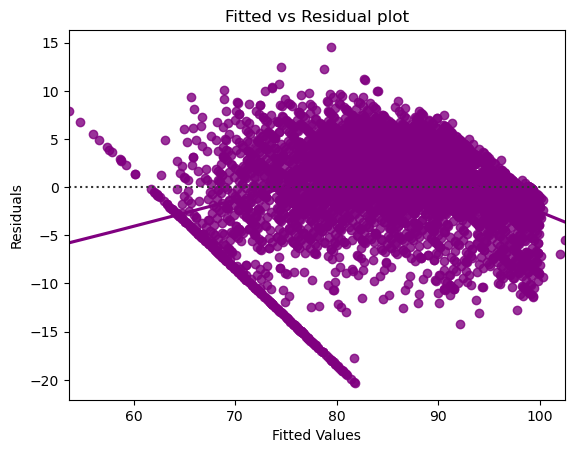

In [287]:
sns.residplot(
    data=df_pred9, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

### Problem 1: Logistic Regression

You are a statistician at the Republic of Indonesia Ministry of Health and you are provided with data of 1473 females collected from a Contraceptive Prevalence Survey. The samples are married women who were either not pregnant or did not know if they were at the time of the survey.

The problem is to predict do/don't they use a contraceptive method of choice based on their demographic and socio-economic characteristics.

#### 2.1 Data Ingestion: Read the dataset. Do the descriptive statistics and do null value condition check, check for duplicates and outliers and write an inference on it. Perform Univariate and Bivariate Analysis and Multivariate Analysis.

In [4]:
df=pd.read_excel('Contraceptive_method_dataset.xlsx')
df

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes


In [5]:
df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [6]:
df.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [7]:
df.shape

(1473, 10)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [10]:
df.describe()

,Wife_age,No_of_children_born,Husband_Occupation
count,1402.000000,1452.000000,1473.000000
mean,32.606277,3.254132,2.137814
std,8.274927,2.365212,0.864857
min,16.000000,0.000000,1.000000
25%,26.000000,1.000000,1.000000
50%,32.000000,3.000000,2.000000
75%,39.000000,4.000000,3.000000
max,49.000000,16.000000,4.000000


In [11]:
df.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [12]:
df['Wife_age']=df['Wife_age'].fillna(df['Wife_age'].mean())
df['No_of_children_born']=df['No_of_children_born'].fillna(df['No_of_children_born'].median())

In [13]:
df.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [14]:
df.duplicated().sum()

82

In [15]:
df[df.duplicated()]

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
79,38.000000,Tertiary,Tertiary,1.0,Scientology,Yes,1,Very High,Exposed,No
167,26.000000,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
224,47.000000,Tertiary,Tertiary,4.0,Scientology,No,1,Very High,Exposed,No
270,30.000000,Tertiary,Tertiary,2.0,Scientology,No,1,Very High,Exposed,No
299,26.000000,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1423,32.606277,Tertiary,Tertiary,2.0,Non-Scientology,No,1,Very High,Exposed,Yes
1440,32.606277,Tertiary,Tertiary,1.0,Non-Scientology,Yes,2,Very High,Exposed,Yes
1447,32.606277,Tertiary,Tertiary,2.0,Non-Scientology,Yes,2,Very High,Exposed,Yes
1467,29.000000,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,Yes


### Exploratory data analysis

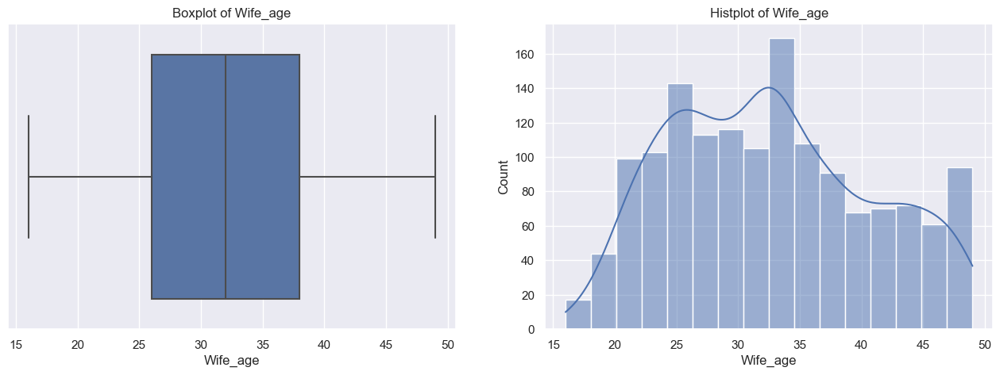

In [16]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['Wife_age'],ax=axis[0])
sns.histplot(x=df['Wife_age'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of Wife_age')
axis[1].set_title('Histplot of Wife_age')
plt.show()

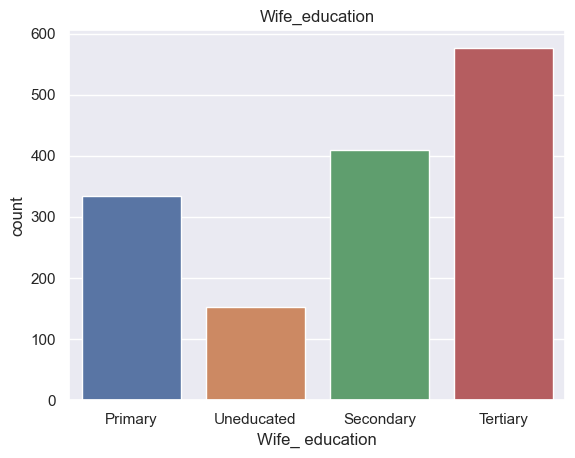

In [17]:
sns.countplot(x=df['Wife_ education'])
plt.title('Wife_education')
plt.show();

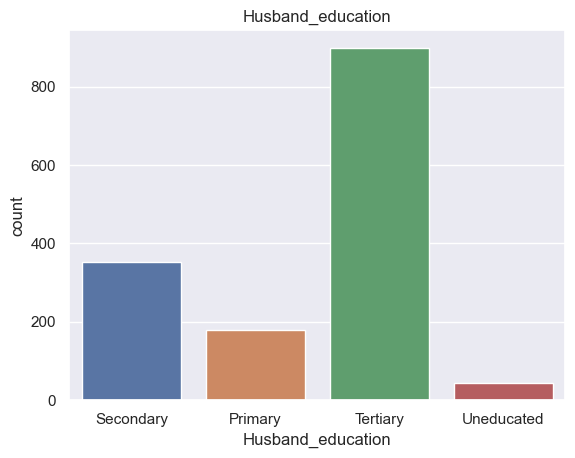

In [18]:
sns.countplot(x=df['Husband_education'])
plt.title('Husband_education')
plt.show();

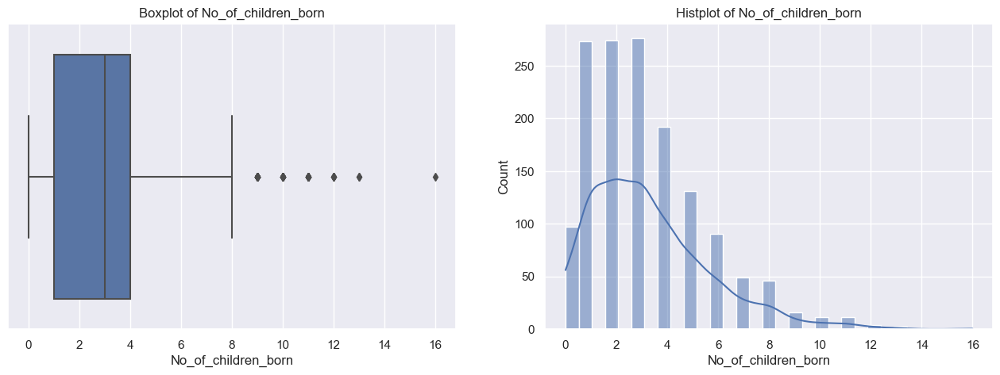

In [19]:
fig, axis = plt.subplots(1,2, figsize = (16,5))
sns.boxplot(x=df['No_of_children_born'],ax=axis[0])
sns.histplot(x=df['No_of_children_born'],ax=axis[1],kde=True)
axis[0].set_title('Boxplot of No_of_children_born')
axis[1].set_title('Histplot of No_of_children_born')
plt.show()

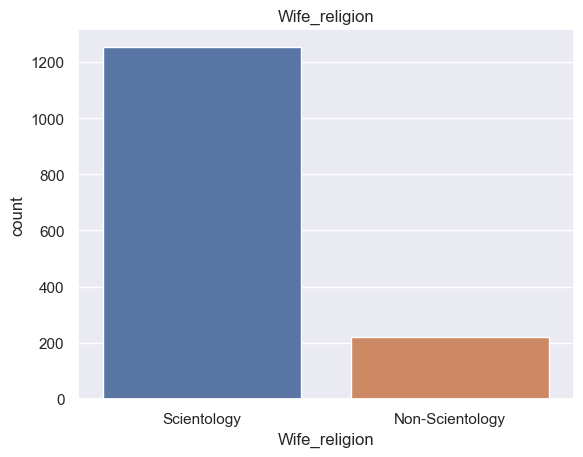

In [20]:
sns.countplot(x=df['Wife_religion'])
plt.title('Wife_religion')
plt.show();

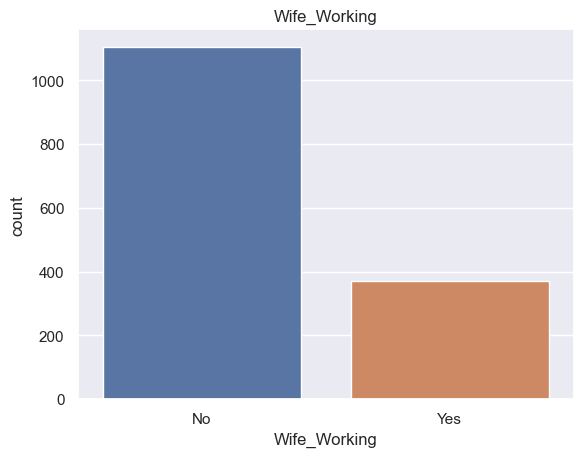

In [21]:
sns.countplot(x=df['Wife_Working'])
plt.title('Wife_Working')
plt.show();

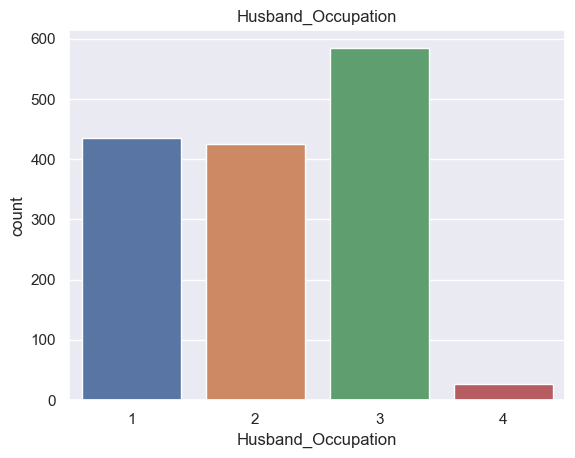

In [22]:
sns.countplot(x=df['Husband_Occupation'])
plt.title('Husband_Occupation')
plt.show();

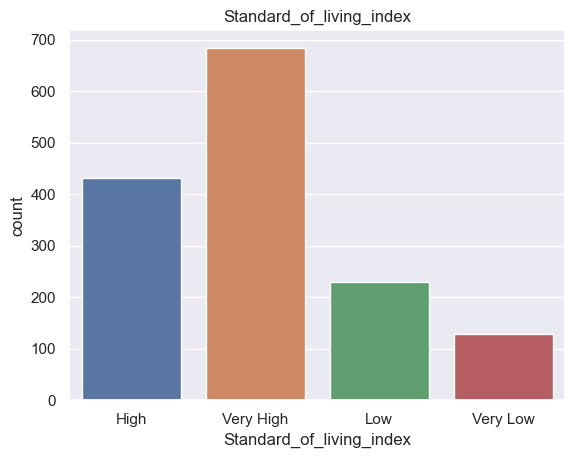

In [23]:
sns.countplot(x=df['Standard_of_living_index'])
plt.title('Standard_of_living_index')
plt.show();

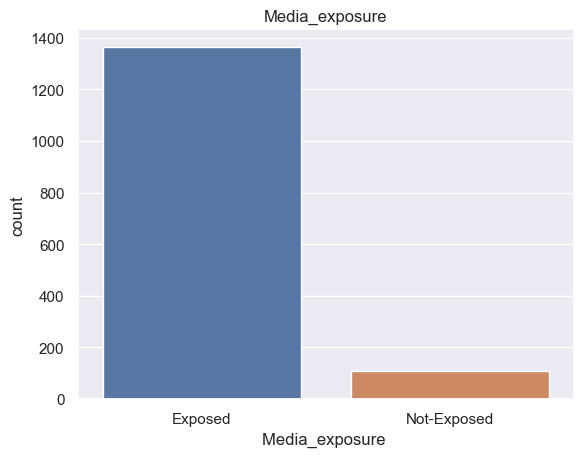

In [24]:
sns.countplot(x=df['Media_exposure '])
plt.title('Media_exposure')
plt.show();

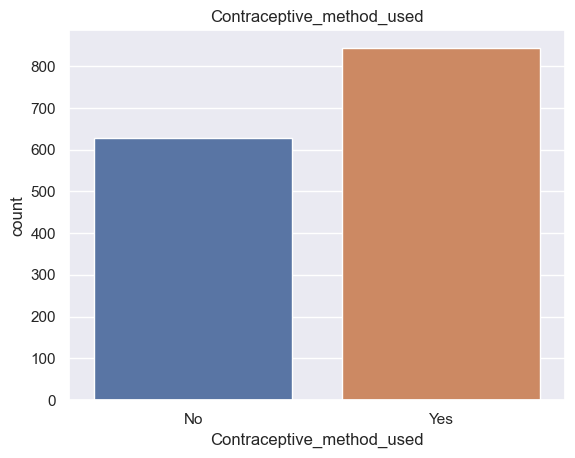

In [25]:
sns.countplot(x=df['Contraceptive_method_used'])
plt.title('Contraceptive_method_used')
plt.show();

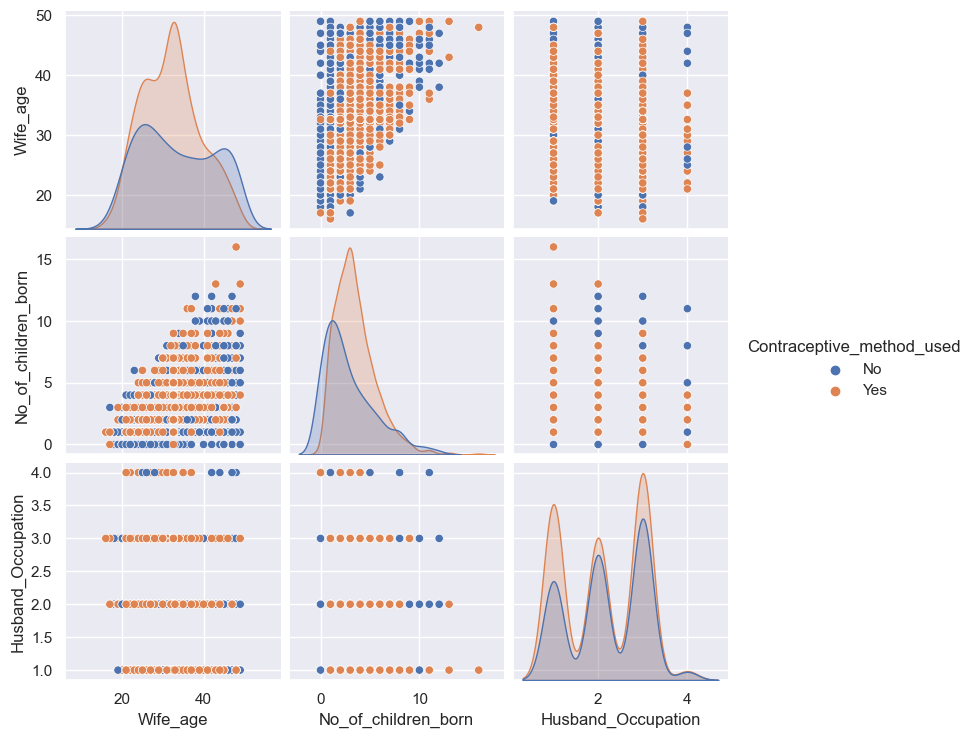

In [26]:
sns.pairplot(data=df,hue='Contraceptive_method_used')

<Axes: >

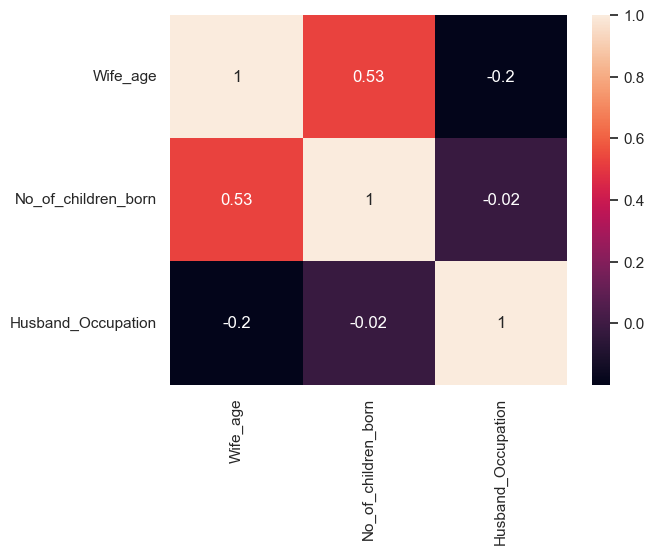

In [27]:
sns.heatmap(df.corr(),annot=True)

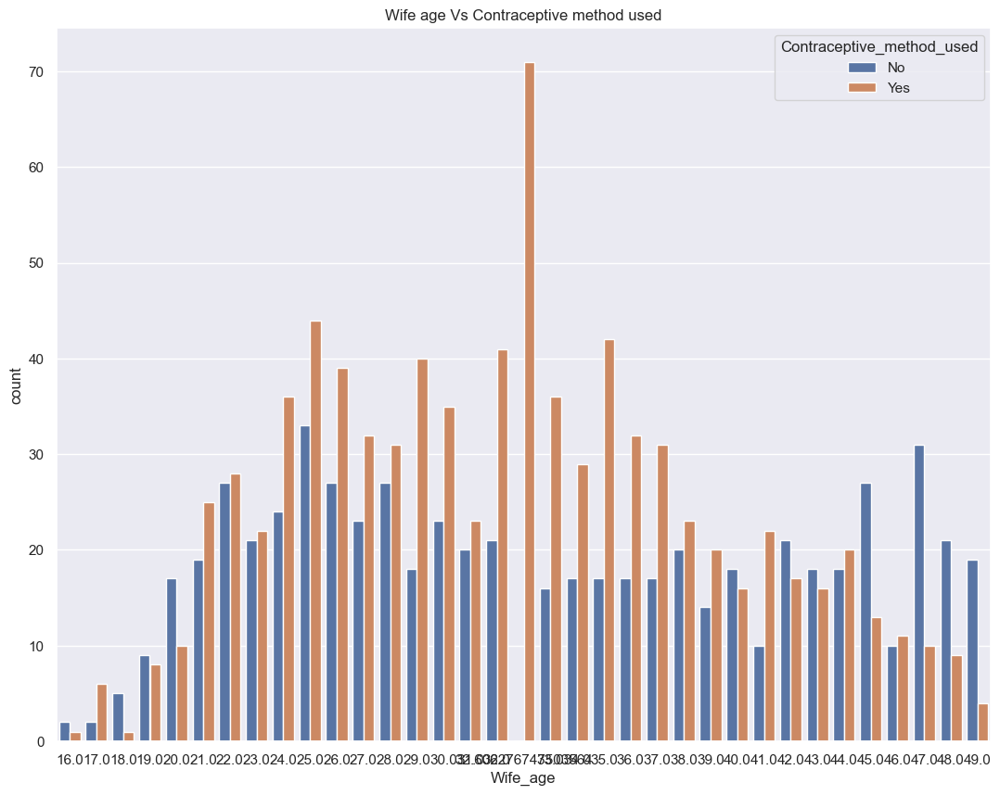

In [28]:
plt.figure(figsize=(13,10))
sns.countplot(df,x=df['Wife_age'],hue=df['Contraceptive_method_used'])
plt.title('Wife age Vs Contraceptive method used')
plt.show();

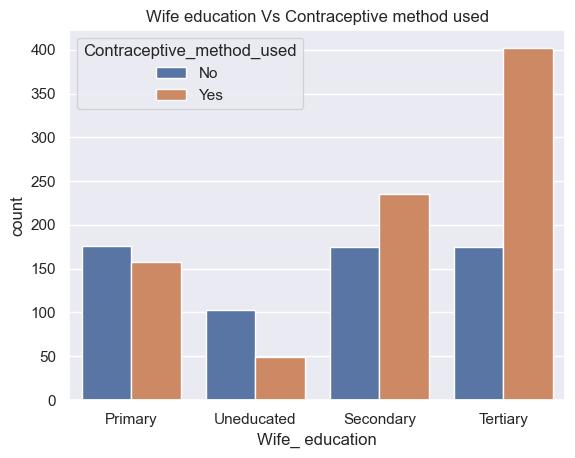

In [29]:
sns.countplot(df,x=df['Wife_ education'],hue=df['Contraceptive_method_used'])
plt.title('Wife education Vs Contraceptive method used')
plt.show();

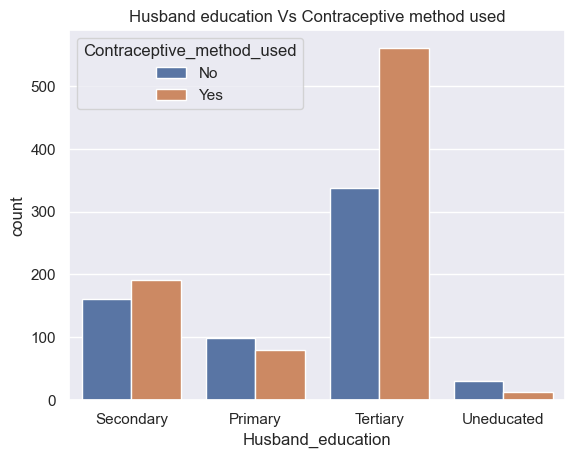

In [30]:
sns.countplot(df,x=df['Husband_education'],hue=df['Contraceptive_method_used'])
plt.title('Husband education Vs Contraceptive method used')
plt.show();

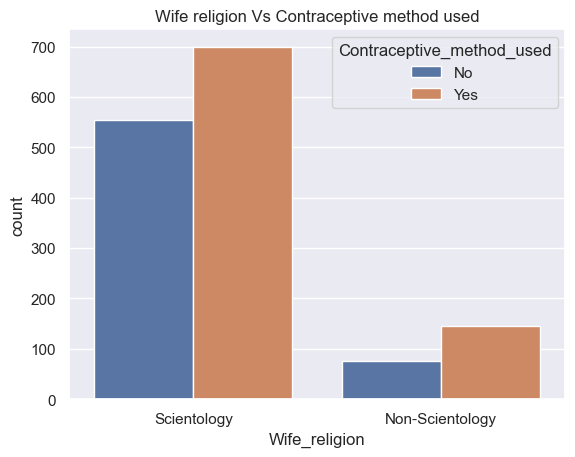

In [31]:
sns.countplot(df,x=df['Wife_religion'],hue=df['Contraceptive_method_used'])
plt.title('Wife religion Vs Contraceptive method used')
plt.show();

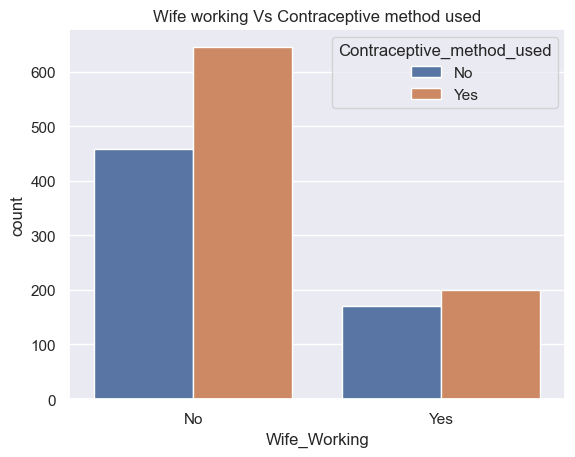

In [32]:
sns.countplot(df,x=df['Wife_Working'],hue=df['Contraceptive_method_used'])
plt.title('Wife working Vs Contraceptive method used')
plt.show();

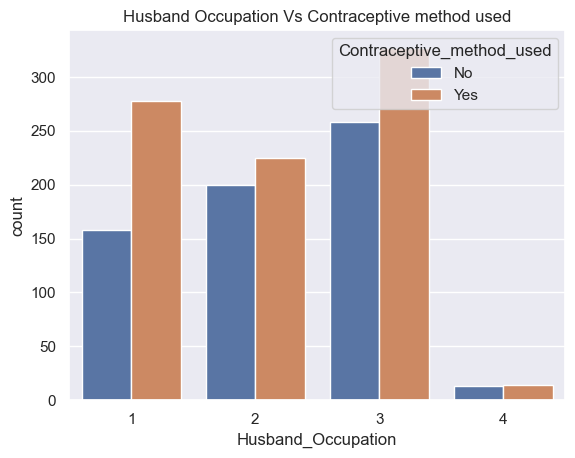

In [33]:
sns.countplot(df,x=df['Husband_Occupation'],hue=df['Contraceptive_method_used'])
plt.title('Husband Occupation Vs Contraceptive method used')
plt.show();

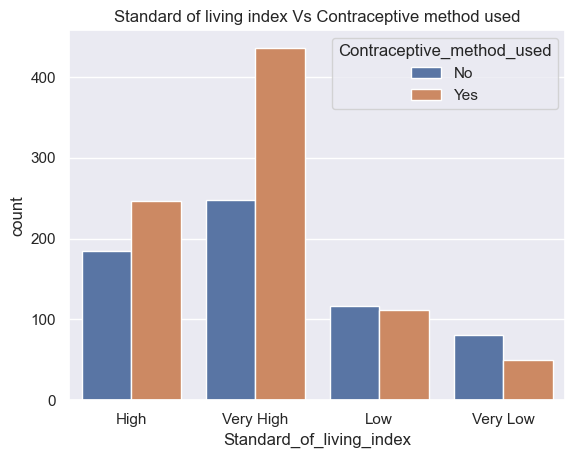

In [34]:
sns.countplot(df,x=df['Standard_of_living_index'],hue=df['Contraceptive_method_used'])
plt.title('Standard of living index Vs Contraceptive method used')
plt.show();

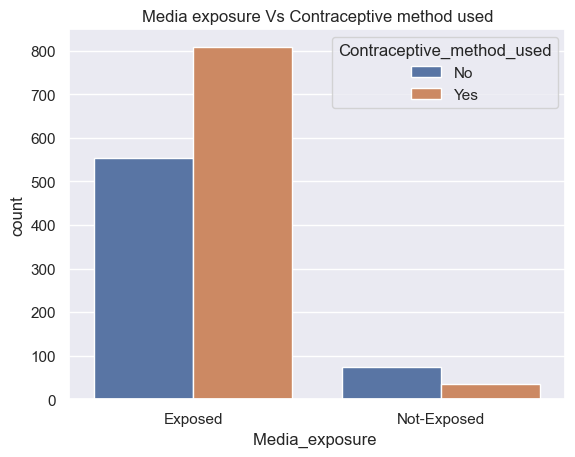

In [35]:
sns.countplot(df,x=df['Media_exposure '],hue=df['Contraceptive_method_used'])
plt.title('Media exposure Vs Contraceptive method used')
plt.show();

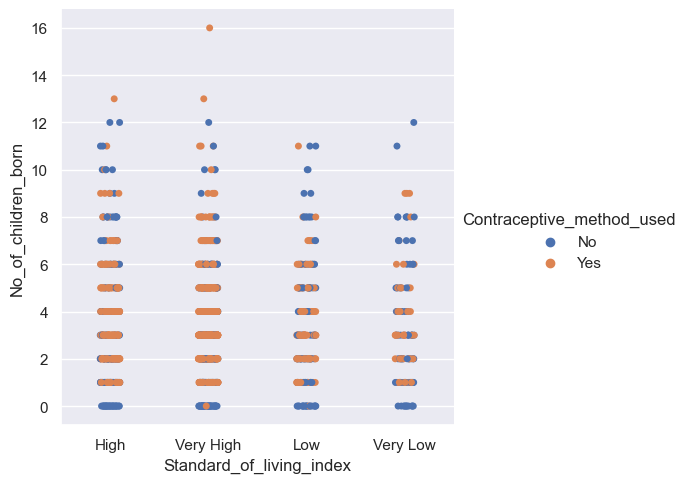

In [36]:
sns.catplot(df, x='Standard_of_living_index', y='No_of_children_born',hue='Contraceptive_method_used')

#### 2.2 Do not scale the data. Encode the data (having string values) for Modelling. Data Split: Split the data into train and test (70:30). Apply Logistic Regression

In [37]:
# separating target and predictors
X = df.drop(["Contraceptive_method_used"], axis=1)
Y = df["Contraceptive_method_used"]

# encoding the target variable
Y.replace({"Yes": 1, 'No': 0},inplace=True)

# adding a constant
X.insert(0, 'const', [1]*X.shape[0])

# creating dummy variables
X = pd.get_dummies(X, drop_first=True)

In [38]:
# splitting in training and test set
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

In [89]:
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)

Shape of Training set :  (1031, 16)
Shape of test set :  (442, 16)


In [41]:
log_reg1 = sm.Logit(y_train, X_train.astype(float)).fit(disp=False)
# setting disp=False will remove the information on number of iterations
print(log_reg1.summary())

                               Logit Regression Results                              
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1031
Model:                                 Logit   Df Residuals:                     1015
Method:                                  MLE   Df Model:                           15
Date:                       Sun, 24 Sep 2023   Pseudo R-squ.:                  0.1110
Time:                               14:19:24   Log-Likelihood:                -624.36
converged:                              True   LL-Null:                       -702.33
Covariance Type:                   nonrobust   LLR p-value:                 1.597e-25
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                  1.4118      0.540      2.615      0.009       0.354       2.470
Wif

In [42]:
# setting the threshold for classification
threshold = 0.5

# model predictions on training data
y_pred_train = np.round(log_reg1.predict(X_train) > threshold)

# model predictions on test data
y_pred_test = np.round(log_reg1.predict(X_test) > threshold)

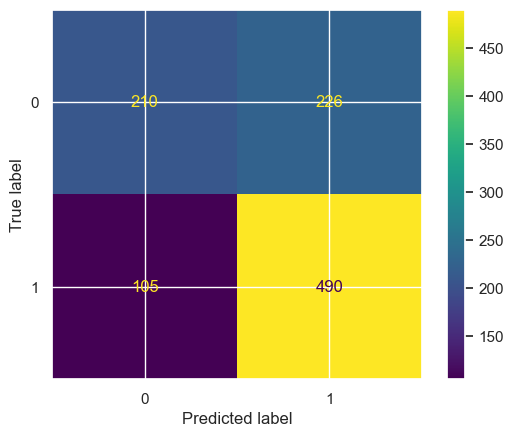

In [45]:
# creating the confusion matrix
cm_train = confusion_matrix(y_train, y_pred_train)

# displaying the confusion matrix
ConfusionMatrixDisplay(cm_train).plot();

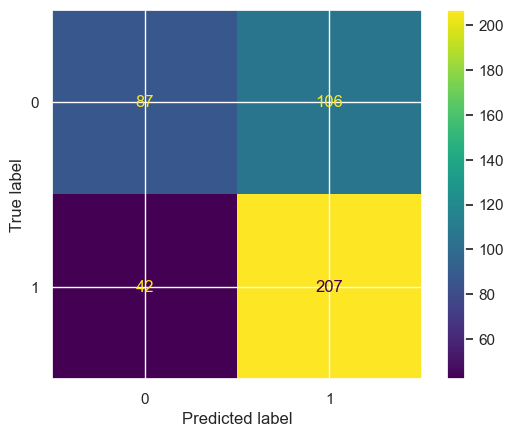

In [88]:
# creating the confusion matrix
cm_test = confusion_matrix(y_test, y_pred_test)

# displaying the confusion matrix
ConfusionMatrixDisplay(cm_test).plot();

In [47]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred_temp = model.predict(predictors) > threshold
    # rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [48]:
print("Training performance:")
model_performance_classification_statsmodels(log_reg1, X_train, y_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.678952,0.823529,0.684358,0.747521


In [49]:
print("Test performance:")
model_performance_classification_statsmodels(log_reg1, X_test, y_test)

Test performance:


,Accuracy,Recall,Precision,F1
0,0.665158,0.831325,0.661342,0.736655


In [50]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

const                                 62.475809
Wife_age                               1.644567
No_of_children_born                    1.544618
Husband_Occupation                     1.315302
Wife_ education_Secondary              1.762549
Wife_ education_Tertiary               2.654850
Wife_ education_Uneducated             1.548559
Husband_education_Secondary            2.491186
Husband_education_Tertiary             3.550438
Husband_education_Uneducated           1.285343
Wife_religion_Scientology              1.123917
Wife_Working_Yes                       1.032792
Standard_of_living_index_Low           1.408206
Standard_of_living_index_Very High     1.526686
Standard_of_living_index_Very Low      1.307327
Media_exposure _Not-Exposed            1.289283
dtype: float64



### All VIF values are below 5. so lets look at p-values and remove accordingly

In [51]:
#2
X_train1 = X_train.drop('Husband_Occupation', axis=1)

In [52]:
log_reg2 = sm.Logit(y_train, X_train1.astype(float)).fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(log_reg2.summary())

                               Logit Regression Results                              
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1031
Model:                                 Logit   Df Residuals:                     1016
Method:                                  MLE   Df Model:                           14
Date:                       Sun, 24 Sep 2023   Pseudo R-squ.:                  0.1105
Time:                               14:24:09   Log-Likelihood:                -624.70
converged:                              True   LL-Null:                       -702.33
Covariance Type:                   nonrobust   LLR p-value:                 6.407e-26
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                  1.6639      0.447      3.723      0.000       0.788       2.540
Wif

In [53]:
log_reg_model_train_perf = model_performance_classification_statsmodels(
    log_reg2, X_train1, y_train
)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.679922,0.828571,0.683773,0.74924


In [54]:
X_test1 = X_test[list(X_train1.columns)]

In [55]:
log_reg_model_test_perf = model_performance_classification_statsmodels(
    log_reg2, X_test1, y_test
)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.665158,0.831325,0.661342,0.736655


In [56]:
#3
X_train2 = X_train1.drop('Husband_education_Secondary', axis=1)

In [57]:
X_train3 = X_train2.drop('Husband_education_Tertiary', axis=1)

In [58]:
X_train4 = X_train3.drop('Husband_education_Uneducated', axis=1)

In [59]:
log_reg3 = sm.Logit(y_train, X_train4.astype(float)).fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(log_reg3.summary())

                               Logit Regression Results                              
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1031
Model:                                 Logit   Df Residuals:                     1019
Method:                                  MLE   Df Model:                           11
Date:                       Sun, 24 Sep 2023   Pseudo R-squ.:                  0.1092
Time:                               14:25:38   Log-Likelihood:                -625.64
converged:                              True   LL-Null:                       -702.33
Covariance Type:                   nonrobust   LLR p-value:                 3.037e-27
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                  1.6444      0.408      4.034      0.000       0.845       2.443
Wif

In [60]:
log_reg_model_train_perf = model_performance_classification_statsmodels(
    log_reg3, X_train4, y_train
)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.677013,0.828571,0.680939,0.747536


In [61]:
X_test4 = X_test[list(X_train4.columns)]

In [62]:
log_reg_model_test_perf = model_performance_classification_statsmodels(
    log_reg3, X_test4, y_test
)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.676471,0.835341,0.670968,0.744186


In [63]:
#4
X_train5 = X_train4.drop('Wife_Working_Yes', axis=1)

In [64]:
log_reg4 = sm.Logit(y_train, X_train5.astype(float)).fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(log_reg4.summary())

                               Logit Regression Results                              
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1031
Model:                                 Logit   Df Residuals:                     1020
Method:                                  MLE   Df Model:                           10
Date:                       Sun, 24 Sep 2023   Pseudo R-squ.:                  0.1092
Time:                               14:29:11   Log-Likelihood:                -625.65
converged:                              True   LL-Null:                       -702.33
Covariance Type:                   nonrobust   LLR p-value:                 7.582e-28
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                  1.6399      0.406      4.035      0.000       0.843       2.436
Wif

In [65]:
log_reg_model_train_perf = model_performance_classification_statsmodels(
    log_reg4, X_train5, y_train
)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.675073,0.82521,0.680055,0.745634


In [66]:
X_test5 = X_test[list(X_train5.columns)]

In [67]:
log_reg_model_test_perf = model_performance_classification_statsmodels(
    log_reg4, X_test5, y_test
)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.674208,0.831325,0.669903,0.741935


In [68]:
#5
X_train6 = X_train5.drop('Media_exposure _Not-Exposed', axis=1)

In [69]:
log_reg5 = sm.Logit(y_train, X_train6.astype(float)).fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(log_reg5.summary())

                               Logit Regression Results                              
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1031
Model:                                 Logit   Df Residuals:                     1021
Method:                                  MLE   Df Model:                            9
Date:                       Sun, 24 Sep 2023   Pseudo R-squ.:                  0.1069
Time:                               14:29:42   Log-Likelihood:                -627.25
converged:                              True   LL-Null:                       -702.33
Covariance Type:                   nonrobust   LLR p-value:                 8.171e-28
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                  1.6481      0.406      4.062      0.000       0.853       2.443
Wif

In [70]:
log_reg_model_train_perf = model_performance_classification_statsmodels(
    log_reg5, X_train6, y_train
)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.675073,0.820168,0.681564,0.74447


In [71]:
X_test6 = X_test[list(X_train6.columns)]

In [72]:
log_reg_model_test_perf = model_performance_classification_statsmodels(
    log_reg5, X_test6, y_test
)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.674208,0.839357,0.667732,0.743772


In [73]:
# defining a function to plot the confusion_matrix of a classification model


def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

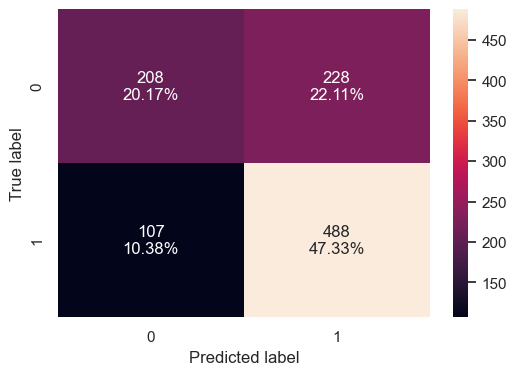

In [74]:
confusion_matrix_statsmodels(log_reg5,X_train6, y_train)

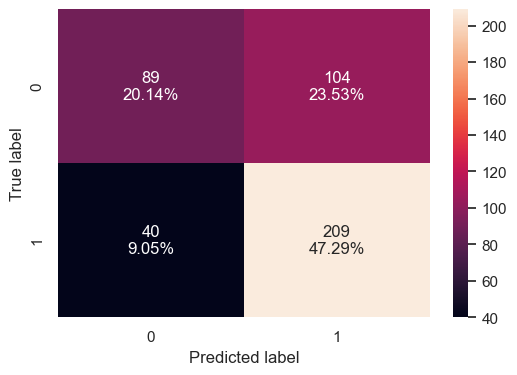

In [75]:
confusion_matrix_statsmodels(log_reg5, X_test6, y_test)

### ROC and ROC-AUC curve

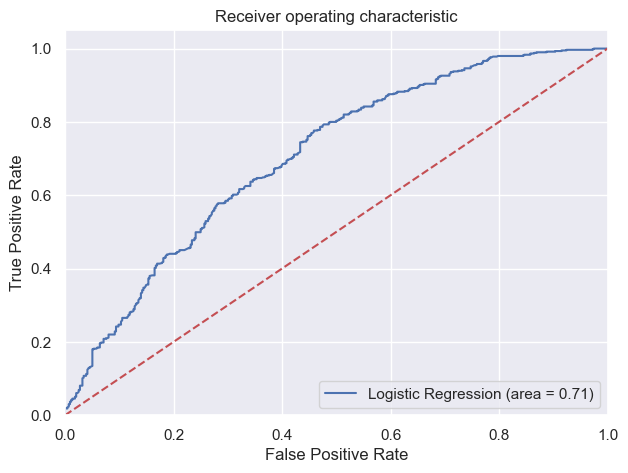

In [77]:
#ROC-AUC on training data
logit_roc_auc_train = roc_auc_score(y_train, log_reg5.predict(X_train6))
fpr, tpr, thresholds = roc_curve(y_train, log_reg5.predict(X_train6))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

In [78]:
logit_roc_auc_train = roc_auc_score(y_train, log_reg5.predict(X_train6))
print("ROC AUC Score on Training Data:", logit_roc_auc_train)

ROC AUC Score on Training Data: 0.705728162824763


### Optimal threshold using AUC-ROC curve

In [79]:
# Optimal threshold as per AUC-ROC curve
# The optimal cut off would be where tpr is high and fpr is low
fpr, tpr, thresholds = roc_curve(y_train, log_reg5.predict(X_train6))

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.5366701276069692


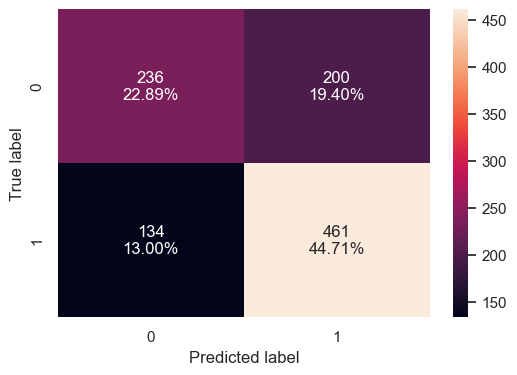

In [80]:
# creating confusion matrix
confusion_matrix_statsmodels(
    log_reg5, X_train6, y_train, threshold=optimal_threshold_auc_roc
)

In [81]:
# checking model performance for this model
log_reg_model_train_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    log_reg5, X_train6, y_train, threshold=optimal_threshold_auc_roc
)
print("Training performance:")
log_reg_model_train_perf_threshold_auc_roc

Training performance:


,Accuracy,Recall,Precision,F1
0,0.676043,0.77479,0.697428,0.734076


### Checking model performance on test data

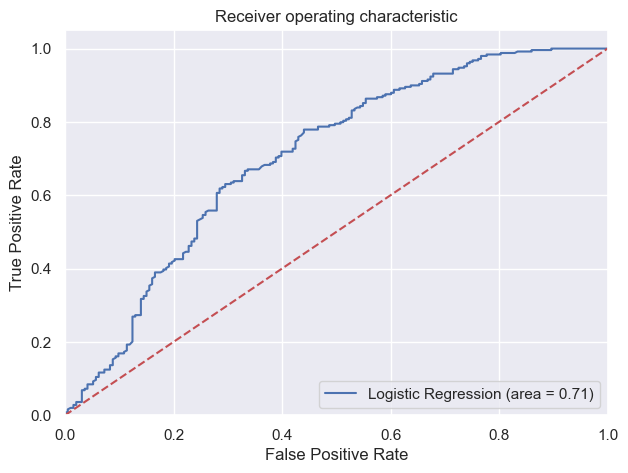

In [82]:
logit_roc_auc_train = roc_auc_score(y_test, log_reg5.predict(X_test6))
fpr, tpr, thresholds = roc_curve(y_test, log_reg5.predict(X_test6))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

In [83]:
logit_roc_auc_test = roc_auc_score(y_test, log_reg5.predict(X_test6))
print("ROC AUC Score on Training Data:", logit_roc_auc_test)

ROC AUC Score on Training Data: 0.7050689805855547


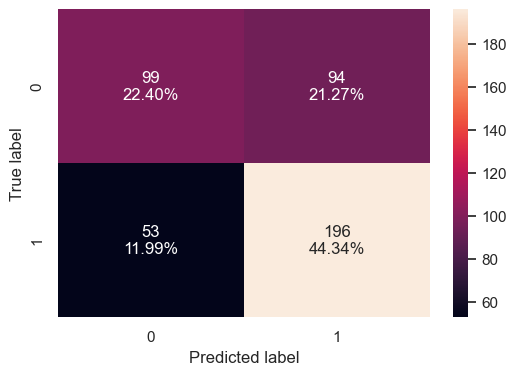

In [84]:
# creating confusion matrix
confusion_matrix_statsmodels(log_reg5, X_test6, y_test, threshold=optimal_threshold_auc_roc)

In [85]:
# checking model performance for this model
log_reg_model_test_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    log_reg5, X_test6, y_test, threshold=optimal_threshold_auc_roc
)
print("Test performance:")
log_reg_model_test_perf_threshold_auc_roc

Test performance:


,Accuracy,Recall,Precision,F1
0,0.667421,0.787149,0.675862,0.727273


- The model with a default threshold (0.5) is giving the best F1 score. Therefore it can be selected as the final model